In [17]:
import numpy as np
import pandas as pd
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize 
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import GaussianNB

import matplotlib.pyplot as plt
import nltk
nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/mengranxia/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/mengranxia/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [18]:
data = pd.read_csv('/Users/mengranxia/Desktop/processed_moments.csv')

In [19]:
data.head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category,id,text
0,27673,2053,24h,I went on a successful date with someone I fel...,I went on a successful date with someone I fel...,True,1,NaN,affection,1,successfully date sympathy connected
1,27674,2,24h,I was happy when my son got 90% marks in his e...,I was happy when my son got 90% marks in his e...,True,1,NaN,affection,2,son marks examination
2,27675,1936,24h,I went to the gym this morning and did yoga.,I went to the gym this morning and did yoga.,True,1,NaN,exercise,3,gym morning yoga
3,27676,206,24h,We had a serious talk with some friends of our...,We had a serious talk with some friends of our...,True,2,bonding,bonding,4,talked friend flaky understood evening hang
4,27677,6227,24h,I went with grandchildren to butterfly display...,I went with grandchildren to butterfly display...,True,1,NaN,affection,5,grandchildren butterfly display crohn conserva...


In [20]:
wd = str(data['text'])

### Word Cloud

In [129]:
stop_words = nltk.corpus.stopwords.words('english')
newstop_words = ['happy','ago','yesterday','lot','today','months','month',
                 'happier','happiest','great','time','last','week','past','was','my','to','with','on','it',
                 'made','and','i','a','of','in','the','for','because','not','from','night','had','got','this',
                 'went','came','able']
stop_words.extend(newstop_words)
  
word_tokens = word_tokenize(wd.lower()) 
  
filtered_sentence = [w for w in word_tokens if not w in stop_words] 
  
filtered_sentence = [] 
  
for w in word_tokens: 
    if w not in stop_words: 
        filtered_sentence.append(w) 
filtered_sentence = str(filtered_sentence)

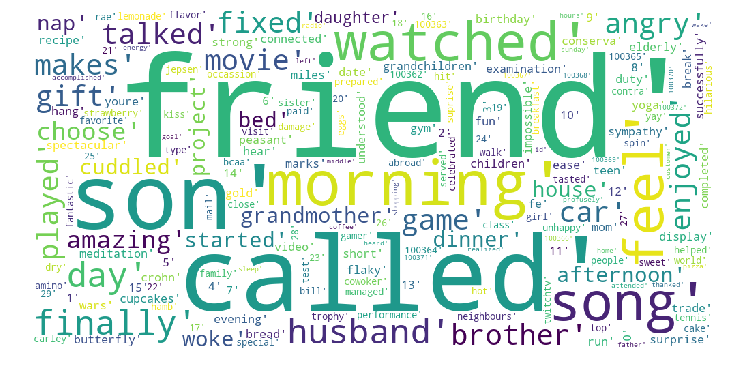

In [130]:
wordcloud = WordCloud(width = 1000, height = 500, 
                background_color ='white', 
                stopwords = [],
                min_font_size = 5).generate(filtered_sentence)
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

### Word Freq

In [204]:
with open('/Users/mengranxia/Desktop/text.csv') as f:
    words = f.read()
    wordfreq = {}
    for word in words.replace(',', ' ').split():
        wordfreq[word] = wordfreq.setdefault(word, 0) + 1
sorted(((v,k) for k,v in wordfreq.items()), reverse=True)

[(7339, 'friend'),
 (6303, 'time'),
 (6186, 'day'),
 (3170, 'family'),
 (2894, 'watched'),
 (2744, 'feel'),
 (2717, 'home'),
 (2631, 'played'),
 (2569, 'finally'),
 (2436, 'son'),
 (2419, 'found'),
 (2313, 'daughter'),
 (2297, 'enjoyed'),
 (2285, 'job'),
 (2168, 'dinner'),
 (2156, 'moment'),
 (2153, 'night'),
 (2126, 'game'),
 (2056, 'birthday'),
 (1996, 'love'),
 (1981, 'nice'),
 (1947, 'life'),
 (1925, 'bought'),
 (1912, 'favorite'),
 (1902, 'husband'),
 (1840, 'wife'),
 (1801, 'received'),
 (1791, 'morning'),
 (1757, 'started'),
 (1717, 'event'),
 (1666, 'dog'),
 (1589, 'school'),
 (1565, 'visit'),
 (1524, 'house'),
 (1459, 'talked'),
 (1452, 'car'),
 (1417, 'hours'),
 (1360, 'walk'),
 (1337, 'finished'),
 (1308, 'girlfriend'),
 (1275, 'movie'),
 (1270, 'im'),
 (1269, 'surprise'),
 (1248, 'won'),
 (1237, 'money'),
 (1223, 'sister'),
 (1135, 'called'),
 (1117, 'completed'),
 (1112, 'food'),
 (1092, 'spend'),
 (1087, 'lunch'),
 (1085, 'fun'),
 (1077, 'told'),
 (1042, 'weeks'),
 (1017,

### Demographics

In [21]:
demo = pd.read_csv('/Users/mengranxia/Documents/GitHub/HappyDB/happydb/data/demographic.csv')

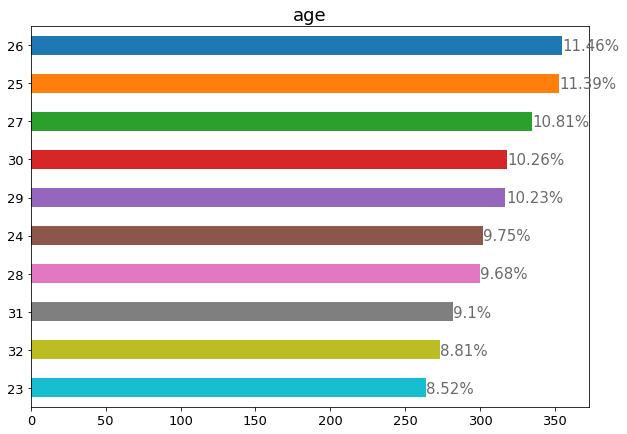

In [7]:
ax = demo['age'].value_counts()[:10].plot(kind='barh', figsize=(10,7), fontsize=13);
ax.set_alpha(0.8)
ax.set_title("age", fontsize=18)
totals = []

for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_width()+.3, i.get_y()+.38, \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,
color='dimgrey')
ax.invert_yaxis()

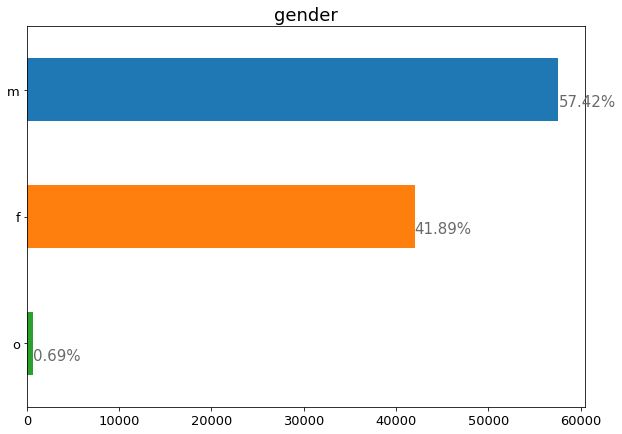

In [289]:
ax = overall['gender'].value_counts().plot(kind='barh', figsize=(10,7), fontsize=13);
ax.set_alpha(0.8)
ax.set_title("gender", fontsize=18)
totals = []

for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_width()+.3, i.get_y()+.38, \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,
color='dimgrey')
ax.invert_yaxis()

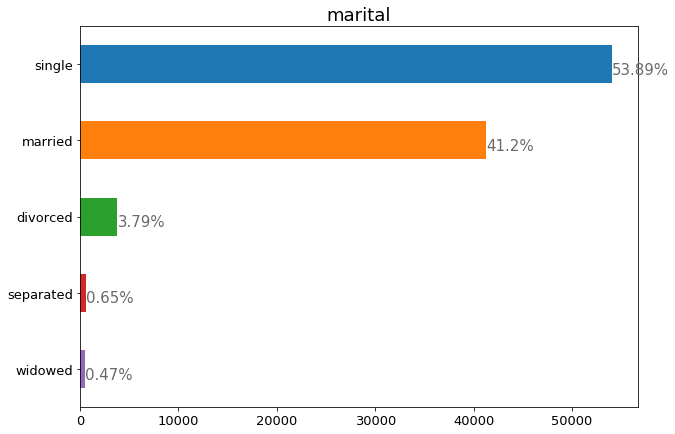

In [290]:
ax = overall['marital'].value_counts().plot(kind='barh', figsize=(10,7), fontsize=13);
ax.set_alpha(0.8)
ax.set_title("marital", fontsize=18)
totals = []

for i in ax.patches:
    totals.append(i.get_width())

total = sum(totals)

for i in ax.patches:
    ax.text(i.get_width()+.3, i.get_y()+.38, \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=15,
color='dimgrey')
ax.invert_yaxis()

In [22]:
overall = pd.merge(data, demo).sort_values(by='wid')

In [23]:
overall.head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category,id,text,age,country,gender,marital,parenthood
5807,28054,1,24h,My mother called out of the blue to tell me ho...,My mother called out of the blue to tell me ho...,True,1,affection,affection,382,mother called blue proud,37.0,USA,m,married,y
5871,102475,1,3m,I was told that i will gain another 5 personal...,I was told that i will gain another 5 personal...,True,1,achievement,achievement,74392,told gain person day july bring totally weeks,37.0,USA,m,married,y
5870,101475,1,3m,I won a free dinner at a local resteraunt thro...,I won a free dinner at a local resteraunt thro...,True,1,NaN,achievement,73397,won free dinner local resteraunt raffle,37.0,USA,m,married,y
5869,100475,1,3m,Being with my wife for over 10 years was a gre...,Being with my wife for over 10 years was a gre...,True,1,NaN,affection,72402,wife feat,37.0,USA,m,married,y
5868,99864,1,3m,I spent the day with my son getting pizza and ...,I spent the day with my son getting pizza and ...,True,1,NaN,affection,71796,spent day son pizza frozen yogurt hang boss,37.0,USA,m,married,y


### Topic Modeling

In [143]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

tfidf = TfidfVectorizer(min_df=5,stop_words = stop_words)
X_tfidf = tfidf.fit_transform(data['text'].values.astype('U'))

In [144]:
feature_names = tfidf.get_feature_names()
print(feature_names[:10])
print(feature_names[-10:])

['aa', 'abandoned', 'abc', 'ability', 'aboard', 'abodes', 'abroad', 'abroadwhen', 'abruptly', 'abs']
['yr', 'yrs', 'yum', 'yummy', 'zaxbys', 'zealand', 'zelda', 'zone', 'zoo', 'zumba']


In [153]:
lda = LatentDirichletAllocation(n_components=6, n_jobs=-1, random_state=123)

In [154]:
X_lda = lda.fit_transform(X_tfidf)
X_lda.shape

(100392, 6)

In [155]:
def print_top_words(model, feature_names, n_top_words):
    for topic_idx, topic in enumerate(model.components_):
        message = "Topic #%d: " % topic_idx
        message += " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)

In [156]:
print_top_words(lda,feature_names,10)

Topic #0: played game son daughter video friend watched baby sleep book
Topic #1: received money found job project finally raise pay bonus class
Topic #2: friend birthday movie watched celebrated party family tv enjoyed favorite
Topic #3: dinner friend visit family home dog day lunch food cat
Topic #4: job temple finished lost ice goal cream day school finally
Topic #5: car day shopping walk bought nice date husband coffee gift


### Sentiment Analysis

In [25]:
nltk.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk import sentiment
from nltk import word_tokenize

sid = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/mengranxia/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [272]:
for sentence in overall['text']:
        print(sentence)
        scores = sid.polarity_scores(str(sentence))
        for key in scores:
                print('{0}: {1}, '.format(key, scores[key]), end='')
        print()

mother called blue proud
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
told gain person day july bring totally weeks
neg: 0.0, neu: 0.673, pos: 0.327, compound: 0.5267, 
won free dinner local resteraunt raffle
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.7906, 
wife feat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spent day son pizza frozen yogurt hang boss
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished catch favorite tv season
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
discovered delicious ramen shopping live
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
told main office totally person day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie weekend blast
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister bought home florida
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife celebrated ten anniversary
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
bonus mturk task
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.5423, 
wife cooked surprise dinner

neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
coworker mine package helped unnecessary appreciated
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
talked neighbor sports
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
workout morning successfully max weight
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
son art class proud extremely
neg: 0.0, neu: 0.563, pos: 0.437, compound: 0.4767, 
found deal hobby items mine
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son obsessed bill nye science guy makes remember childhood makes
neg: 0.159, neu: 0.841, pos: 0.0, compound: -0.1779, 
received items purchased online mail
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched son scavenger hunt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found sex child
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pursuit happiness crucial motivated strategies employee productive employee tend efficient effect emit positive energy reason properly compensation enjoyed love respect job employee hes

watched boston red sox played win season game live
neg: 0.0, neu: 0.53, pos: 0.47, compound: 0.7351, 
cooked night baked chicken yummy leftovers dinner tonight
neg: 0.0, neu: 0.673, pos: 0.327, compound: 0.5267, 
appointment cardiologist news continue performance daily activities heart issues news
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
relax watched television survey cat jumped lap purring
neg: 0.0, neu: 0.707, pos: 0.293, compound: 0.4404, 
decent weather chicken breast veggies grilled temp finally outdoor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
weather broke spent hours diddling garden moved love garden prelude upcoming garden season
neg: 0.156, neu: 0.611, pos: 0.233, compound: 0.34, 
watched basketball game saturday night ncaa finally played game monday
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.34, 
sat house day saturday watched april fools snow event lasted day night love snow fun
neg: 0.141, neu: 0.529, pos: 0.33, compound: 0.6486, 
local store decided buy scrat

neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
fan gift supermarket shopping regular
neg: 0.0, neu: 0.366, pos: 0.634, compound: 0.6369, 
lonely drive moter bike
neg: 0.455, neu: 0.545, pos: 0.0, compound: -0.3612, 
cousin played hockey moment joyfull energitic performance
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.34, 
friend restaurant variety dish food enjoyed moment hungry
neg: 0.0, neu: 0.48, pos: 0.52, compound: 0.7579, 
communicate people world social media network global friend excited moment
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6808, 
bonus job im regular moment
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.5423, 
friend wedding anniversary spent time moment
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
kiss girl friend feel
neg: 0.0, neu: 0.25, pos: 0.75, compound: 0.7184, 
road trip friend awesome
neg: 0.0, neu: 0.215, pos: 0.785, compound: 0.8074, 
cute proposed girl feel person world
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.4588, 
ball hit stree

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found extra day tomorrow
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
feedback customer
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
score game played
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
nice walk afternoon
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
selected training
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished read book
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched funny night
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
told training
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk cute dog
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
nice conversation mom
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
refund nonrefundable tickets
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enjoyed nice relax afternoon waterfront
neg: 0.0, neu: 0.182, pos: 0.818, compound: 0.8402, 
beautiful weather talked walk lunch time
neg: 0.0, neu: 0.562, pos: 0.438, compound: 0.5994, 
successfully up

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played cricket friend time
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.6808, 
movie wife night spend leisure time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received purchased laptop
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
night club friend spend time
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
promotion senior level extremely
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
purchased watched
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
club night friend time
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
received gift wife token love
neg: 0.0, neu: 0.297, pos: 0.703, compound: 0.7964, 
received purchased mobile phone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lunch wife time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received special bonus successfully project deal
neg: 0.0, neu: 0.242, pos: 0.758, compound: 0.8555, 
received gift wife token love
neg: 0.0, neu: 0.297, pos: 0.703, compound: 0.7964, 
received sp

neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
finished code project
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
repair screen iphone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
kart race time didnt love
neg: 0.457, neu: 0.543, pos: 0.0, compound: -0.5216, 
discovered set based camping climbed couple peaks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cleaned backpack gear organized trip
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found backpack lost
neg: 0.535, neu: 0.465, pos: 0.0, compound: -0.3182, 
bought leather seat covered car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started planned day backpack trip
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
met girl im date friend approved
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.7184, 
tore lawn replace sod
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
security couple book editing deal
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
fastest time treadmill
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
clothes shopping 

neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
friend
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.4939, 
review music album
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
met friend brian
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
downloaded album free released artist
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
hung world renowned super smash bros player
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.5994, 
sex female friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
smoking weed close friend
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
watched basketball game
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched twin peaks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hung family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
delivered flowers mother sister enjoyed
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
dinner family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drove hom eot visit family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 0.699, pos: 0.301, compound: 0.9217, 
railway station pet received friend time pet cherry activities ready run hold tight seat silent waiting friend finally friend met moved railway station car park time suddenly lady shouted bag stolen catch guy run excited pet cherry run chasing thief finally cherry caught thief people congrats pet excited intelligent
neg: 0.14, neu: 0.533, pos: 0.327, compound: 0.9062, 
planned weekend planned time friend dont planned fixed planned movie finished lunch hotel played cricket finally shopping movie ready shouldnt escape book tickets including smile agreed im lucky friend dear friend
neg: 0.032, neu: 0.447, pos: 0.521, compound: 0.9682, 
railway station received uncle training delayed waiting station passengers hall time suddenly met girlfriend waiting nearby city training delayed questions replied questions mobile share mobile friend agreed speak uncle training arrived friend
neg: 0.094, neu: 0.642, pos: 0.264, compound: 0.7845, 
severe 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
time struggling solution finally software installed configuration computer project
neg: 0.231, neu: 0.579, pos: 0.19, compound: -0.128, 
control feel anger hard night kids
neg: 0.56, neu: 0.44, pos: 0.0, compound: -0.6249, 
finally beautiful beast movie
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.5994, 
nice time park sun warm
neg: 0.0, neu: 0.39, pos: 0.61, compound: 0.5719, 
found deal radio ive
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
listening song
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
extra money weekend dont
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
rose planted yard
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought makeup items id
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sale local department store found bargain
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.2023, 
found book love read
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
mend favorite sweater wearable
neg: 0.0, neu: 0.5, pos: 0.5, compound: 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played pet
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.34, 
sunset
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
meet lover day morning
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.5859, 
day meet friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
meet friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
chappathi
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
reward company performance
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
lover day
neg: 0.0, neu: 0.208, pos: 0.792, compound: 0.5859, 
kiss lover day
neg: 0.0, neu: 0.132, pos: 0.868, compound: 0.765, 
beach day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
kiss lover
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.765, 
sex worker day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
meet office friend day
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
upma break fastto day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
office day
neg: 0.0, neu: 1.0, pos: 0.0, co

neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
love climate feel intend day hit time makes person
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
love climate feel intend day hit time makes person
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
frustrated bus time managed fine
neg: 0.415, neu: 0.366, pos: 0.22, compound: -0.3818, 
frustrated bus time managed fine
neg: 0.415, neu: 0.366, pos: 0.22, compound: -0.3818, 
frustrated bus time managed fine
neg: 0.415, neu: 0.366, pos: 0.22, compound: -0.3818, 
scolded aunty bus seat sitting travel smoothly im im feel wonderful wonderful im waiting finally arrow hinted deathstroke olive felicity
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.8126, 
scolded aunty bus seat sitting travel smoothly im im feel wonderful wonderful im waiting finally arrow hinted deathstroke olive felicity
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.8126, 
scolded aunty bus seat sitting travel smoothly im im feel wonderful wonderful im waiting finall

neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.5994, 
grandmother suddenly house village brought fruit cocktail mix fruit tasted feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
helped fallen helpless cow ride house provided water vegetables eat cow slowly moved
neg: 0.333, neu: 0.667, pos: 0.0, compound: -0.6705, 
morning prepared special noodles cute sister
neg: 0.0, neu: 0.283, pos: 0.717, compound: 0.765, 
balcony suddenly pigeons played love chasing
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.765, 
night coming home puppy dog streetside shivered feed puppy dog biscuts dropped dog shelter saftey
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
evening played hiding seeking sister cute girl feel
neg: 0.175, neu: 0.397, pos: 0.429, compound: 0.4939, 
browsing internet found website influence life
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
morning walk nature sweet elderly sister day time chat laugh
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.765, 
evening friend visted house bro

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cooked pot roast family time beautiful
neg: 0.0, neu: 0.562, pos: 0.438, compound: 0.5994, 
delicious dinner mom easy prepared
neg: 0.0, neu: 0.19, pos: 0.81, compound: 0.8176, 
aunt decided didnt car decided
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cone cat healed surgery
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
rain morning worried walk friend dog rain sun house
neg: 0.177, neu: 0.565, pos: 0.258, compound: 0.25, 
received check mail freelance job completed forgot nice surprise
neg: 0.0, neu: 0.458, pos: 0.542, compound: 0.7269, 
burger lunch cooked perfect wasnt rare welldone
neg: 0.0, neu: 0.619, pos: 0.381, compound: 0.5719, 
received online coupon email free items regular
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
green chile stew perfect pork moist chile spicy
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.5719, 
received bigger recycling container city dont worried filled
neg: 0.0, neu: 0.788, pos: 0.212, compound

neg: 0.0, neu: 0.467, pos: 0.533, compound: 0.7906, 
night trichy erode nice travel thanked god nice moment
neg: 0.0, neu: 0.321, pos: 0.679, compound: 0.8625, 
god lunch god thanked heaven holy spirits
neg: 0.0, neu: 0.224, pos: 0.776, compound: 0.8555, 
morning sister daughter born child god
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.2732, 
evening purchased cookies sister daughter told matter hear
neg: 0.0, neu: 0.864, pos: 0.136, compound: 0.0258, 
morning pray world saved earth earth warm god answer time cured situation moment
neg: 0.0, neu: 0.497, pos: 0.503, compound: 0.7964, 
night dinner friend enjoyed party nice moment
neg: 0.0, neu: 0.2, pos: 0.8, compound: 0.9001, 
canada beautiful world
neg: 0.0, neu: 0.339, pos: 0.661, compound: 0.5994, 
lunch worker nice lunch time nice moment
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
day church attended worship nice god presence nice moment
neg: 0.0, neu: 0.336, pos: 0.664, compound: 0.836, 
wrote letter government united 

won game row fifa xbox live
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
snapchat filter dance bunny
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bonus mturk
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.5423, 
watched dave chappelle stand netflix
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
worker offer cake lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mom called check
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
burrito local tacos shopping lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched favorite team win playoffs game
neg: 0.0, neu: 0.37, pos: 0.63, compound: 0.7783, 
girlfriend dish
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
visit parents day home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stranger complimented hat
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
boss lunch break usual
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
girlfriend rub
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched inside nba pouring champagne charles barkley

neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.4404, 
stock market rebounded upbeat positive news update
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.5574, 
cleveland cavaliers won game night celtics event enjoyed
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7906, 
spurs favorite premiere league team solid win leicester entertaining sports event
neg: 0.0, neu: 0.383, pos: 0.617, compound: 0.8834, 
real estate agent list home list update options
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
executive nice investment trade results fluctuation stock market earned profit results
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.6908, 
weather nice england run sun ray
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
parents confirmed date visit summer forward time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received job lead previous eagerly interview
neg: 0.0, neu: 0.658, pos: 0.342, compound: 0.3818, 
favorite tv nineties relaunched twin peaks season found
neg: 0.0, neu: 0.7, pos: 0.3,

weather finally warm
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.2263, 
easy day
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.4404, 
students cute
neg: 0.0, neu: 0.25, pos: 0.75, compound: 0.4588, 
people buy tickets fundraiser planned
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friday tomorrow
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
free coffee starbucks
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
relax walk
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.4404, 
sleep morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found nice tax return
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
completed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
client appointment
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
plenty time read afternoon
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enjoyed dinner family
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
sun shining woke morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
laptop arrived
neg: 0.0, neu: 1.0, pos:

neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
learned department leader
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
learned bit office
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched tv girlfriend night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
workout
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
helped education users software
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pizza
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eat dinner mother step father
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sleep pet
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stay drink mix drink girl
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spend evening watched shameless girlfriend
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.34, 
helped catch project
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taking afternoon nap cat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
workout
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
helped girlfriend mother moved
neg: 0.0, neu: 1.0, pos: 0.0, 

neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.8555, 
excited called admitted semester rough questions
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.4215, 
excited day accepted choice college remember called admission counselor received accepted letter told
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.6808, 
movement change person person time time movement concerned completed school unforgettable movement family waiting results momentum movement
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
moment life birthday daddy smart phone surprise date day exitedi forget date day life date family surprise daddyrest surprise daddy
neg: 0.073, neu: 0.579, pos: 0.347, compound: 0.7269, 
moment birth son waiting meet day unexplainable
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
moment life birthday daddy smart phone surprise date day exitedi forget date day life date family surprise daddyrest surprise daddy
neg: 0.073, neu: 0.579, pos: 0.347, compound: 0.7269, 
didnt nerous studdied harder struggl

neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.25, 
enjoyed park garden children
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
planted tree
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
oil massage morning session
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
queen bar enjoyed time
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
goa sky diving amazing
neg: 0.0, neu: 0.282, pos: 0.718, compound: 0.6249, 
leave approved day
neg: 0.24, neu: 0.2, pos: 0.56, compound: 0.3818, 
school admission daughter
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treat hotel taj
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
isha temple family feel spiritual effect
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought tv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
outing friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
daughter passed sslc exam
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bhagubali film
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ooty summer holiday
neg: 0.0, ne

neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
bought car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend donuts
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
son brought flowers
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband gift certificate massage
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
lost pounds
neg: 0.697, neu: 0.303, pos: 0.0, compound: -0.3182, 
won lottery
neg: 0.0, neu: 0.213, pos: 0.787, compound: 0.5719, 
friend gift jewelry box
neg: 0.0, neu: 0.247, pos: 0.753, compound: 0.7269, 
son received job selected air force
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter selected school chamber orchestra
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter track team
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend found baby
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
computer
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter selected chamber orchestra
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
neighbor cookies
n

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son played crane game store won pig top hat
neg: 0.0, neu: 0.432, pos: 0.568, compound: 0.7845, 
grocery store fresh strawberry tub
neg: 0.0, neu: 0.635, pos: 0.365, compound: 0.3182, 
grocery store fresh cherry
neg: 0.0, neu: 0.566, pos: 0.434, compound: 0.3182, 
husband brought son home lightup fidget spinner joy son feel
neg: 0.0, neu: 0.703, pos: 0.297, compound: 0.5859, 
son piano practice telling
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sisterinlaw announced finally bring daughter philippines united live
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.4215, 
husband son sitting lumberjack style breakfast morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son singing song choir sheets music
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son spray sunburn soothing spray sunburn neck
neg: 0.0, neu: 0.723, pos: 0.277, compound: 0.3182, 
husband late coming home due truck break finally door
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0,

neg: 0.524, neu: 0.476, pos: 0.0, compound: -0.296, 
cat vet checkup hes cancerfree
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally star wars movie love
neg: 0.333, neu: 0.278, pos: 0.389, compound: 0.1531, 
ice cream blizzard night delicious
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
found super cheap plane tickets upcoming trip
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.5994, 
parents
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found favorite brand chocolate sale day
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.4588, 
fun band played live friend
neg: 0.0, neu: 0.183, pos: 0.817, compound: 0.836, 
delicious seafood pizza friend sunday
neg: 0.0, neu: 0.303, pos: 0.697, compound: 0.7845, 
job interview higherpaying job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
unexpected bonus mturk
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.5423, 
brought delicious cake
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
found unexpected coat pocket day
neg: 0.0, neu: 1.0,

neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.5859, 
dad bought tickets nba playoffs day attended game weekend excited
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.34, 
amazon mechanical turk won dollars bonus correct guess percentage amount task involved money
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.836, 
subwoofer brand computer speaker birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received multiple bonus night mturk bonus description wonderful surprise morning
neg: 0.0, neu: 0.319, pos: 0.681, compound: 0.9153, 
binge reward redeem passed xbox live free
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.7906, 
successfully cabinet mom
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
mom fixed foot pedal sewing machine wouldnt slide forward sewing
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched carlsagan game streamer twitch fun watched
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
warm day cockatiel watched enjoyed outdoor
neg: 0.0, neu: 0.435, pos: 0.565

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog finally learned shake
neg: 0.362, neu: 0.638, pos: 0.0, compound: -0.1779, 
aunt brought lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
aunt visit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cat learned door
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hike sweat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
breakfast
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
store neighborhood
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
shoes mail
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
delicious breakfast
neg: 0.0, neu: 0.213, pos: 0.787, compound: 0.5719, 
bit money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
license
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turntable
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won race
neg: 0.0, neu: 0.213, pos: 0.787, compound:

neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
party friend time
neg: 0.0, neu: 0.145, pos: 0.855, compound: 0.7096, 
team rooting won game
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
reached goal video game played
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.4215, 
ice cream
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
marathon tv enjoyed
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
watched april fools video funny
neg: 0.352, neu: 0.33, pos: 0.319, compound: -0.0772, 
won match game played
neg: 0.0, neu: 0.247, pos: 0.753, compound: 0.7269, 
nice lunch
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.4215, 
watched video enjoyed
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
dinner friend fun
neg: 0.0, neu: 0.133, pos: 0.867, compound: 0.7579, 
expansion video game played
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
watched video funny
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
played board game friend
neg: 0.0, neu: 0.263, pos: 0.737, compo

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nephew helped cut piece plastic car lips
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.2732, 
string guitar
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched episode attack titan season
neg: 0.437, neu: 0.563, pos: 0.0, compound: -0.4767, 
helped brother dig hole yard told professional landscaping job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sex girlfriend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found amplifier electric guitar cleaned basement
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lots people received masters qualification mturk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mom hospital heart attack
neg: 0.508, neu: 0.492, pos: 0.0, compound: -0.4767, 
cleaned finally
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought girlfriend sim game
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
game downloaded spend night couple day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
persona ps brother
neg: 0.0, neu: 1.0, pos: 0.0, 

walk miles
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk hours morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eat healthy day
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
watched wrestlemania friend time forever
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
talked friend phone time
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
friend friend watched wrestlemania
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.7506, 
bought run shoes comfortable
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
walk nature time weather
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received nice bonus
neg: 0.0, neu: 0.137, pos: 0.863, compound: 0.743, 
talked friend talked
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
cooked nice dinner tonight brother
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
baked treat friend
neg: 0.0, neu: 0.145, pos: 0.855, compound: 0.7096, 
lifted weight time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk miles
neg: 0.0, neu:

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
browsing center
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hospital
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
computer centre
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hospital
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
browsing center
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
shopping
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played ground
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.34, 
shopping
neg

wife doctor concerned report bad news wedding fear
neg: 0.528, neu: 0.472, pos: 0.0, compound: -0.7717, 
kids bed wife shopping sitting read book time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife babysitter date hours enjoyed time
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
thieves broke house didnt steal irreplaceable music equipment
neg: 0.444, neu: 0.364, pos: 0.191, compound: -0.538, 
wife dinner waiting home weather super nice ate deck
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.7717, 
bought daughter bike birthday awesome reaction
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.6249, 
friend town house hang couple hours
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
pastor church paid nice complimented guitar played worship team
neg: 0.0, neu: 0.329, pos: 0.671, compound: 0.8481, 
stumped finally mother day gift mom
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
book pretty nice hotel wife weekend getaway weekend
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.

neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
spoke brother started rebuilding bridge weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
marine layer clouds hug mountainside stay highway drive home fog
neg: 0.0, neu: 0.744, pos: 0.256, compound: 0.4767, 
hit love makes focus life
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
caught gopher destroyed garden
neg: 0.516, neu: 0.484, pos: 0.0, compound: -0.4939, 
pears tree didnt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
furniture live moved refinish floor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
filled tax form realized larger refund expected
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bunch peach started growing peach tree
neg: 0.0, neu: 0.746, pos: 0.254, compound: 0.1779, 
equipment properly happened
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
laser engraved machine run
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
garden blooming added planted
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wonderful sunday 

feel grateful thinking spend time mom wife mother day flowers
neg: 0.0, neu: 0.75, pos: 0.25, compound: 0.4588, 
win referral contest reddit referral link broadcast
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.5859, 
flowers mom wife mother feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
research figured repair issues car passed inspection pay mechanical
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.1027, 
infant daughter squeal joy played
neg: 0.0, neu: 0.326, pos: 0.674, compound: 0.7351, 
escalator tension wife calm talked argument hug
neg: 0.364, neu: 0.227, pos: 0.409, compound: 0.1531, 
taught board game family hadnt played game struggling game understood played game
neg: 0.264, neu: 0.584, pos: 0.151, compound: -0.1877, 
baby daughter meet bunch family time smile time
neg: 0.0, neu: 0.737, pos: 0.263, compound: 0.3612, 
pizza family scratch love
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
bought baby floaties test daughter time tub
neg: 0.0, neu: 1.0, pos: 0.0, com

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fish wife time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hold friend baby
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
dinner wife daughter parents
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nap hr
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
light bill lower
neg: 0.524, neu: 0.476, pos: 0.0, compound: -0.296, 
car passed inspection
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sun finally weeks rain
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
seminar participated phone visit parents told goal free regain peace mind person forgive life event situation feel repeat forgive completed
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.875, 
lab report cholesterol awesome
neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.6249, 
internet fixed tech figured
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter received award music tonight
neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.5423, 
friend mother surgery
neg: 0.0, neu: 0.385, pos

neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
design attractive covered image cousin improved company google profile view
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.7184, 
bought mobile phone mobile phone price offer street festival time camera mobile selfie phone front camera
neg: 0.0, neu: 0.824, pos: 0.176, compound: 0.4939, 
morning city jallikattu bull fight festival enjoyed function loud voice whistle
neg: 0.152, neu: 0.468, pos: 0.38, compound: 0.5994, 
played clash clan manual game railroad friend
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
rode bike critical road magic superb experience bike race game enjoyed evening time
neg: 0.117, neu: 0.508, pos: 0.376, compound: 0.7269, 
morning walk friend unexpected snake played time snake dance
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.6808, 
played seesaw game park time friend sitting laugh
neg: 0.0, neu: 0.352, pos: 0.648, compound: 0.8481, 
km walk wife hard morning time moment cross road
neg: 0.149, neu: 0.85

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally moved house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enjoyed drink colleagues
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
saved money grocery store coupon
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
feel hurt
neg: 0.773, neu: 0.227, pos: 0.0, compound: -0.5267, 
helped colleagues print job level
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
discount lunch buy combo
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
peas started sprout veggies garden unsuccessful
neg: 0.333, neu: 0.667, pos: 0.0, compound: -0.3612, 
basil seeds finally germinated
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
extra gift voucher mistake mail
neg: 0.289, neu: 0.361, pos: 0.349, compound: 0.128, 
mother aunt brother coming visit house september
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
deal tv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
refund check company payment error
neg: 0.403, neu: 0.597, pos: 0.0, compound: -0.4019, 
finish

ozma dorothy girl age properly princess associate youth ruler oz lonely lack companionshipthe creek whippoorwills nest roll hill wild flowers soothing sound meadow larks sight sound childhood
neg: 0.154, neu: 0.772, pos: 0.074, compound: -0.3612, 
quiet solitary withal humor contentment overflowing eyesthey feel validated story human believed computer wrong computer advice ominous heeding computer
neg: 0.212, neu: 0.538, pos: 0.25, compound: 0.0, 
everyday moment wake husband reached spoon sweet twoyear climbed cuddled moment hold people love close
neg: 0.0, neu: 0.583, pos: 0.417, compound: 0.8225, 
swam shiny shimmering malaysian sea glimpse black white caught eyes head cautious black white puppy fall wet slippery jetty watched frightening fall wavy water
neg: 0.173, neu: 0.827, pos: 0.0, compound: -0.5574, 
history record choice people hold people similar circumstances basically choicesi prepared predicted dramatic ray kurzweils age spiritual machinesit words water continue sound wo

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked customer improved health
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
mexican food favorite restaurant
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
tax finished
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
read joke reddit
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.296, 
found car involved recall
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
repair friend computer
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
sister law arrived day visit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enjoyed cappuccino favorite coffee shopping
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.743, 
played fetch dog
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
coffee dad morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
anniversary dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
purchased wireless thermometer smoker
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found beef broccoli recipe
neg: 0.0, neu: 1.0, pos: 0.0, c

sad forgetten bicycle key mom found key ready office
neg: 0.246, neu: 0.556, pos: 0.198, compound: -0.1531, 
planned tour summer vocation father buy tickets surprise
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.2732, 
brother planned dubai tour visa enjoyed missed
neg: 0.21, neu: 0.476, pos: 0.314, compound: 0.2732, 
brother return home town visit dubai bought chocolate perfume
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brother giving surprise prepared cake innovative art
neg: 0.0, neu: 0.244, pos: 0.756, compound: 0.8074, 
eagerly awaiting arrived suddenly decision return home dubai received smiley enjoyed front
neg: 0.0, neu: 0.511, pos: 0.489, compound: 0.8225, 
dad smart phone surprise birthday excited forget day life surprise dad
neg: 0.11, neu: 0.349, pos: 0.541, compound: 0.7506, 
uncle abroad quality time precious
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
moment everyday mom bye ready
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
uncle live mumbai received

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
restaurant eat chinese food friend
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
florida nice stopped beach
neg: 0.284, neu: 0.299, pos: 0.418, compound: 0.2263, 
finally nephew time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
donat items local charity kids game clothes items
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.4215, 
friend havent time
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
kids played fun
neg: 0.0, neu: 0.149, pos: 0.851, compound: 0.6908, 
learned painting artist
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
donat local organized children
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend party saturday time fun
neg: 0.0, neu: 0.179, pos: 0.821, compound: 0.8481, 
local mom pop restaurant havent visit recently time food delicious
neg: 0.0, neu: 0.709, pos: 0.291, compound: 0.5719, 
puppy store adorable dog bought
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
bonus recently performance
neg: 0.0, n

paid credit card
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.3818, 
weeks massage
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
portillos hot dog lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mturk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mexican food friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
found sister coming town baby
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cleaned entire ground
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ive hours mturk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought comfortable mattress
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
didnt smoking cigarette
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
date night blast
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched episode
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
progress competition overwatch
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
bunch gourmet tacos absolutely amazing lunch
neg: 0.0, neu: 0.55, pos: 0.45, compound: 0.624, 
date time life

neg: 0.706, neu: 0.294, pos: 0.0, compound: -0.5859, 
ate food enjoyed
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
sky looked beautiful day
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.5994, 
relax watched walk dead
neg: 0.467, neu: 0.217, pos: 0.315, compound: -0.34, 
didnt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fresh spring breeze coming window
neg: 0.0, neu: 0.635, pos: 0.365, compound: 0.3182, 
boyfriend picture cat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gift sisterinlaw
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.4404, 
lunch sushi buffet restaurant boyfriend son
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
snuggled boyfriend weeks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
yo boyfriend didnt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
left day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
shopping hours
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
traffic light morning kids spring break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started writing

neg: 0.0, neu: 0.423, pos: 0.577, compound: 0.872, 
friend celebrated bestie birthday day agoit reunion friendsit party rock time friendsit memorable moment
neg: 0.0, neu: 0.534, pos: 0.466, compound: 0.8625, 
competition hidden talent employeesi participated won jackpot drawing competitionit proud moment reward bonus
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.9501, 
bought mobile phone purposethough smartphone age special bond iphone boughti feel finally found phonei feel phone
neg: 0.0, neu: 0.847, pos: 0.153, compound: 0.4019, 
severe water scarcity street necessities buy water pricesbut nowadays god grace relieved ground water restoredit moment family
neg: 0.113, neu: 0.563, pos: 0.325, compound: 0.5994, 
day father birthdayusually dont celebrated birthday time decided party hardso hired party maker surprise day memorableit time
neg: 0.128, neu: 0.553, pos: 0.319, compound: 0.5426, 
pimple bothering weekbut woke itit rid
neg: 0.342, neu: 0.658, pos: 0.0, compound: -0.3818, 
walk

neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.2732, 
son cleaned kitchen told apparently beat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband paid vehicle payment
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played video game decompress life stress
neg: 0.304, neu: 0.435, pos: 0.261, compound: -0.1027, 
chocolate bar discovered kitchen
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sleep unexpected husband kids
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
im watched dr husband turk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started reduced methadone dosage free
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
alien covenant tonight husband time movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dachshund ant poison fineafter stomach pump force caused throw dumb sweet dog
neg: 0.362, neu: 0.479, pos: 0.16, compound: -0.5859, 
employer finally paid pay check
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.1027, 
husband surprise pack lunch ready late
neg: 0.0, neu: 0.465, p

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
family coming visit spend time cabin
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
emotional abusive partner
neg: 0.618, neu: 0.147, pos: 0.235, compound: -0.5574, 
haircut stylist
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
vegetables garden lush
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
flowers garden
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
time exploring national park
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
partner brunch birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
planted flowers garden evening
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
learned friend buy house ireland
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
learned bouchon birthday weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
learned family coming visit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
planted spring vegetables garden
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
photos published major public
neg: 0.0, neu: 1.0, pos: 0.

neg: 0.0, neu: 0.411, pos: 0.589, compound: 0.5106, 
day vocation bible school started church children participated vbs
neg: 0.0, neu: 0.661, pos: 0.339, compound: 0.6249, 
celebrated birthday excited
neg: 0.0, neu: 0.141, pos: 0.859, compound: 0.7269, 
hours earlier planned
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched season finally survivor episode
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
found extra bill wallet didnt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found summer vacation planned fall
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
loaf banana bread
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
coworker drink fun time
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
hit triple darts time life
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife finished puzzle
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
neighbor cat coming visit house fun stand porch visit stopped afternoon
neg: 0.134, neu: 0.634, pos: 0.232, compound: 0.34, 
brewers win road trip


neg: 0.0, neu: 0.495, pos: 0.505, compound: 0.6249, 
online fight video game friend won match
neg: 0.193, neu: 0.296, pos: 0.511, compound: 0.6486, 
spend time handicraft exhibition love art
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
wonderful fish pond
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
played chess uncle resort
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
managed entered famous concert heavy crowd
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought puppy cute
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
relatives birthday party house
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.4019, 
bought sofa cost twenty thousand rupees
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched cat birth kitten
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won level chess tournament held delhi
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
family marriage party time friend
neg: 0.0, neu: 0.337, pos: 0.663, compound: 0.7096, 
amusement park water ride husba

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter decided friend vacation spot parents pay trip
neg: 0.132, neu: 0.566, pos: 0.302, compound: 0.4215, 
gas maintenance person arrived minutes called water heater gas light
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
floor woods arrived acclimated installed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
glad spring rain california means ride bicycle single day
neg: 0.0, neu: 0.727, pos: 0.273, compound: 0.4588, 
car finally car body shopping fixed windshield front grilled smoothly hood flying object debris
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
local dentist covered dental planned
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife home depot selected hardwood carpet renovated home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received congratulatory tshirt udemy corporate activities evaluation courses
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received brook bicycle seat amazon rode time special model spring makes differenc

neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.1027, 
moment life visa forget moment existence
neg: 0.275, neu: 0.725, pos: 0.0, compound: -0.2263, 
lying sofa mother tickle laugh
neg: 0.34, neu: 0.3, pos: 0.36, compound: 0.0516, 
listening song drive car feel blissful time fun im
neg: 0.0, neu: 0.493, pos: 0.507, compound: 0.802, 
greeted birthday text people surprise surprise
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.6486, 
mother surprise birthday celebrated party hall excited day moment
neg: 0.0, neu: 0.314, pos: 0.686, compound: 0.872, 
uncle live mumbaiwhen received called unclei speak themtheir children spoke baby voiceits nice hear time
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.4215, 
ate food pizza burger drink jigarthanda food suitable health condition tasted
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
responsibility honour family respect unforgettable day sorrow surroundingsbut wellthats
neg: 0.21, neu: 0.37, pos: 0.42, compound: 0.5267, 
unfortunatelyi grandma hous

neg: 0.0, neu: 0.429, pos: 0.571, compound: 0.8519, 
church participated corporate worship lyrics song reminded beautiful attributes god
neg: 0.0, neu: 0.461, pos: 0.539, compound: 0.802, 
leadoff batter diamondbacks hit home run
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife love morning
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.6369, 
ran toner printer looked internet found including shipped staples toner cartridge internet staples paid
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife owned mineral rights land oklahoma oil gas company offer lease land threesixteenths productive occurred
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife special breakfast bacon skillet potatoes cheese bast eggs
neg: 0.0, neu: 0.748, pos: 0.252, compound: 0.4019, 
received shipment bottle favorite salsa dallas texas
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.4588, 
received check mail recently jury duty
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
grabbed dollars jury instruction hit stra

eat delicious lunch fresh deli meat
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.7184, 
daughter run home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
night rest
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sex wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lunch downstairs
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
seafood festival weekend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
atlantic city weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
overtime extra pay
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.1027, 
writing sweet card wife flowers
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
spend mother day wife mom
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pay credit card bill
neg: 0.233, neu: 0.333, pos: 0.433, compound: 0.296, 
pack wife lunch daughter
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mcdonalds breakfast coffee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spend weekend house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
family safe bad

neg: 0.309, neu: 0.364, pos: 0.327, compound: 0.0516, 
office met grandpa grandma share uncle summer vocation trip blessed bright future life
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.8402, 
ready office parents send cute smile nice day care
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.9186, 
planned tour summer vocation father buy tickets surprise
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.2732, 
uncle live mumbai received called uncle speak children spoke baby voice nice hear time
neg: 0.0, neu: 0.823, pos: 0.177, compound: 0.4215, 
moment everyday mom bye ready
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
im lying sofa mother tickle laugh
neg: 0.309, neu: 0.364, pos: 0.327, compound: 0.0516, 
dad laptop surprise birthday excited forget day life surprise dad
neg: 0.131, neu: 0.414, pos: 0.455, compound: 0.5719, 
played game friend congratulated heaven movement favourite movement life
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.836, 
uncle house sister born baby love

neg: 0.206, neu: 0.542, pos: 0.252, compound: 0.2892, 
received email nicesized bonus weeks mturk totally forgotten promised bonus pay dutch oven purchased im gal
neg: 0.147, neu: 0.451, pos: 0.401, compound: 0.8012, 
hubby successfully surgery correct enduring
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
close friend reached goal lose pounds sane healthy manner
neg: 0.18, neu: 0.333, pos: 0.487, compound: 0.5574, 
finances trip friend wedding anniversary
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
favorite baseball team won game team division im elated
neg: 0.0, neu: 0.355, pos: 0.645, compound: 0.8979, 
cableinternet bill increase due merger negotiate deal package cost
neg: 0.0, neu: 0.777, pos: 0.223, compound: 0.3182, 
dinner crummy rainy day dont cooked
neg: 0.206, neu: 0.794, pos: 0.0, compound: -0.0772, 
husband adult daughter announced lost pounds doctor told health improved drastically weight loss pleased
neg: 0.223, neu: 0.485, pos: 0.291, compound: 0.34, 
hu

neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.8442, 
played game friend congratulated heaven movement favourite movement life
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.836, 
dad laptop surprise birthday excited forget day life surprise dad
neg: 0.131, neu: 0.414, pos: 0.455, compound: 0.5719, 
moment everyday mom bye ready
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
uncle abroad quality time precious
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
eyes filled tears laugh celebrated life
neg: 0.156, neu: 0.246, pos: 0.598, compound: 0.7506, 
enjoyed merry groundgiant wheelsdora doracolumbus merry ground shouted aloud moment blissful
neg: 0.0, neu: 0.33, pos: 0.67, compound: 0.9349, 
typewriting exam distinction
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought carit lifetime dream dream true
neg: 0.0, neu: 0.306, pos: 0.694, compound: 0.7003, 
enjoyed alagar festival celebrated madurai god alagar golden chariot family
neg: 0.0, neu: 0.328, pos: 0.672, compound: 0.90

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
im mom monday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
toddler eat ice cream
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
video husband
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sephora vib sale
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day watched kdrama pizza
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started watched kdrama favorite actor ji change wook
neg: 0.0, neu: 0.7, pos: 0.3, compound: 0.4588, 
discovered brand coffee love
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
day mturk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought delicious fruit salad
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
bought mom food
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
turk day saturday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day sunday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pizza sunday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found shoes ross
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
morni

neg: 0.0, neu: 0.452, pos: 0.548, compound: 0.8176, 
progress cleaned house weekend rid bag trash donat goodwill im moved step ready day
neg: 0.0, neu: 0.694, pos: 0.306, compound: 0.6486, 
lunch coworker catch dont chat fun time
neg: 0.311, neu: 0.689, pos: 0.0, compound: -0.4023, 
nice night tonight attended son band concert school job stage proud hes
neg: 0.0, neu: 0.629, pos: 0.371, compound: 0.7096, 
overtime parttime job picked extra money opportunity
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.4215, 
night son surprise cleaned home weve behavior skills act kinds responsibility hes
neg: 0.0, neu: 0.84, pos: 0.16, compound: 0.2732, 
bought home recently inspection performance results inspection major issues attended worried wasnt im pleased
neg: 0.277, neu: 0.723, pos: 0.0, compound: -0.5583, 
started time job opportunity totally caught surprise wonderful opportunity extra cash home ive money pleased
neg: 0.0, neu: 0.403, pos: 0.597, compound: 0.9305, 
bought house finally saved

neg: 0.0, neu: 0.823, pos: 0.177, compound: 0.4215, 
ate food pizza burger drink jigarthanda food suitable health condition tasted
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
responsibility honour family respect unforgettable day sorrow surrounded
neg: 0.224, neu: 0.329, pos: 0.447, compound: 0.5267, 
enjoyed merry giant wheels dora dora columbus merry round shouted aloud moment blissful
neg: 0.0, neu: 0.388, pos: 0.612, compound: 0.9349, 
moment everyday mom bye ready
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
watched daughter played trampoline park
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
walk warm day
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.2263, 
watched daughter easter bunny
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk sun dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally spent time wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
raise
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cleaned bill health physical
neg: 0.0, neu: 1.0, pos: 0.

neg: 0.12, neu: 0.443, pos: 0.437, compound: 0.6124, 
complimented sincerely worki proud successfully
neg: 0.0, neu: 0.076, pos: 0.924, compound: 0.9042, 
salary rs purchased mobile brotheri momentit unforget life time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brother child bornand nursing mei describe feltbut unforgettable birth brother born hold time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
remember post diploma graduation dayi post diploma certificatethe smile facethe hell worth
neg: 0.256, neu: 0.5, pos: 0.244, compound: -0.296, 
laugh hard telling storyi barley endwhen finished book tap store space couple minutesbecause collect return reality
neg: 0.074, neu: 0.737, pos: 0.189, compound: 0.4939, 
birthday text people surprisesgood moment time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
listening songwhen drive car feel blissful time fun
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.802, 
day blind sold nature scenario photos god photos price rs gentle genuine bought ite

neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
wife washed car surprise
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.2732, 
bought desktop computer sleek
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won raffle won ipod
neg: 0.0, neu: 0.213, pos: 0.787, compound: 0.8126, 
wife bought rolex watched
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally performance oil change car taking car shopping
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mum released hospital admitted stomach flu
neg: 0.325, neu: 0.5, pos: 0.175, compound: -0.296, 
daughter told love morning left house
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
found favorite tie lost couch
neg: 0.277, neu: 0.361, pos: 0.361, compound: 0.1779, 
wife favorite pancakes breakfast
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
daughter kiss morning left house
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
wife bought pair tshirt valentines
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
raise yearly review
neg: 0

neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.2732, 
movie parents enjoyed parents moment
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
salary rs spent rs purchased costumes parents time money parents
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ready office met school day friend share school day remember happiness
neg: 0.0, neu: 0.378, pos: 0.622, compound: 0.8885, 
sister child born nursing describe unforgettablebirth sister born hold time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
laugh hard telling stay barley finished tap store space couple minutes collect return reality
neg: 0.082, neu: 0.706, pos: 0.212, compound: 0.4939, 
listening song drive car feel blissful time fun im
neg: 0.0, neu: 0.493, pos: 0.507, compound: 0.802, 
film familyi feel moment life
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
moment life visa forget moment existence
neg: 0.275, neu: 0.725, pos: 0.0, compound: -0.2263, 
moment college day weeks day bunk class film beach resort moment
neg: 0.0, ne

neg: 0.31, neu: 0.69, pos: 0.0, compound: -0.2023, 
sold car private
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
car shopping car excited buy car debt free
neg: 0.189, neu: 0.379, pos: 0.432, compound: 0.4939, 
grandparents uk visit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
night children weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cleaned house mom stay
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
looked car set test drive time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
planted garden
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
realized extra pair socks didnt laundry
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
managed bus connected seamless cut transition time minutes home awaiting package earlier
neg: 0.16, neu: 0.84, pos: 0.0, compound: -0.2732, 
found perfect recipe love birthday cake finished cake ice hours
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.836, 
baked cake planned frosting perfect worried wouldnt
neg: 0.202, neu: 0.459, pos: 0.339, compound: 0.

neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.5106, 
run distance tired feel hard gym pay
neg: 0.588, neu: 0.412, pos: 0.0, compound: -0.5719, 
meet friend catch
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
lunch food delicious
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
bought home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
met nephew
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fixed car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
met niece
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought nice pair jeans
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
shopping
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
golf
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
promotion job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
meet niece
neg: 0.

neg: 0.0, neu: 0.577, pos: 0.423, compound: 0.5267, 
cat carried toy bedroom night wake played
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.34, 
cat ran head soft screen door glass slide door
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife doctor broken foot xray minor sprain
neg: 0.341, neu: 0.659, pos: 0.0, compound: -0.4767, 
called morning weeks set job interview job applied online
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won dollars bet win game won money
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.9042, 
love crumb cake specific grocery store stock purchased eat
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
weekend wife spent day beach close house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
haircut looked short cut
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.2732, 
cat woke morning lying chest meowed attention
neg: 0.362, neu: 0.638, pos: 0.0, compound: -0.5267, 
errands putting weeks finally easier expected
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.421

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
shopping mall
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
college
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
collage
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
shopping mall
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
collage
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
computer class
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
temple
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
jumped
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
computer class
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
college
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
competar cola
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
halp
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched raindrops race window feel managed feel journal feel
neg: 0

neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
night tip money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
night night money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
earlier cedar time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
earlier exboyfriend realized chance
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.25, 
night night money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
moved hometown
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend told love time
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
dog bandage injury healed perfect
neg: 0.295, neu: 0.316, pos: 0.389, compound: 0.2263, 
couple night refund check wasnt expected
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
heard friend hadnt talked
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
dog earlier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
couple moved hometown
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
guy hang tonight
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
favorite roommate watched


neg: 0.0, neu: 0.288, pos: 0.712, compound: 0.8126, 
friend popular limited shoes hes searching
neg: 0.174, neu: 0.275, pos: 0.55, compound: 0.6249, 
bit extra money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought keyboard mouse desperately
neg: 0.464, neu: 0.536, pos: 0.0, compound: -0.3818, 
bought mother
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
learned money mturk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
helped friend pool
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
bought mother birthday mother day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
puppy company house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend car broke
neg: 0.4, neu: 0.143, pos: 0.457, compound: 0.1027, 
bought box special donuts
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.4019, 
started funds saved money moved
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
sequel favorite game announced
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
eat friend outback
neg: 0.0, neu: 0.385, p

laying sofa mother tickle laugh
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.5574, 
laying sofa mother tickle laugh
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.5574, 
office grandpa grandma share uncle summer vocation trip blessed bright future life
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.8402, 
ready office parents send cute smile nice day care
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.9186, 
sad forgetten bicycle key mom found key ready office
neg: 0.246, neu: 0.556, pos: 0.198, compound: -0.1531, 
im lying sofamy mother tickle laugh
neg: 0.309, neu: 0.364, pos: 0.327, compound: 0.0516, 
hours close friend moment
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
uncle abroad hereits quality time precious
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
ready office parents send cute smile nice day care
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.9186, 
planned tour summer vocation father buy tickets surprise
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.2732, 
siste

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
human society volunteer adopted animals annual shelter event
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
trip hill station
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
truck friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
purchased wireless mouse keyboard laptop
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
purchased smart phone
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
purchased pickle market
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drank cup coffee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
phone called school friend
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
temple wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
celebrated parents anniversary happily
neg: 0.0, neu: 0.215, pos: 0.785, compound: 0.8074, 
kiss child
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.4215, 
visit neighbours house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
purchased video game
neg: 0.0, neu: 1.0, pos: 0.0, compound

taught received payment music lesson
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
successfully completed paid complex easter church service organist
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
parents music students told children enjoyed lesson
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
ate burrito bowl chipotle
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
productive rehearsal elementary band difficult
neg: 0.385, neu: 0.615, pos: 0.0, compound: -0.3612, 
weekend church organist music director planned executive successfully confirmed mass service people people attended
neg: 0.0, neu: 0.802, pos: 0.198, compound: 0.4939, 
penultimate lesson band students demonstrate skills progress
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.4215, 
random ran friend hadnt time
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
chat friend phone
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
weather nice didnt jacket
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
cash

neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.6908, 
drink friend phone girl
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
finished finally school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend finally beat level video game stuck
neg: 0.196, neu: 0.49, pos: 0.314, compound: 0.296, 
found youtube channel essential radio channel showcase type jazzlofi hiphop song
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend havent
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
survey
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally coins collect received decent amount money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
planned meet grandma lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
introduced people gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
coming hometown friend family
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
road trip dad national park time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
santa monica beach hop ocean body surfing swimming fun
ne

neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.4215, 
happiness simple goal progress elusive means continue finding satisfaction contentment feel joy sense life meaningful kinds depend finding ease comfortable jolly elated time individual fulfilledfortunate
neg: 0.0, neu: 0.325, pos: 0.675, compound: 0.9837, 
nowadays happiness fuzzy concepts people challenge science happiness identify concepts happiness application split components relatives concepts wellbeing quality life flourishing author define happiness contentment comments focus difference hedonistic tradition seeking pleasant avoiding unpleasant experience eudaimonic tradition live life deeply satisfying
neg: 0.091, neu: 0.498, pos: 0.411, compound: 0.9601, 
mental reflect judgements person wellbeing variety biological psychological economic religious philosophical approaches striven define happiness identify sources research including positive psychological happiness economic employer scientific method research questions happin

neg: 0.0, neu: 0.326, pos: 0.674, compound: 0.7351, 
son day school academic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
figured edge crochet project
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally found cheap flip flops crochet slippers
neg: 0.286, neu: 0.714, pos: 0.0, compound: -0.34, 
money transfer bank account friday finally account pending
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
convenience store favorite flavor ice cream day decided ice cream
neg: 0.0, neu: 0.75, pos: 0.25, compound: 0.4588, 
time wasnt muggy rain
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
seafood salad bought dinner tasty
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stopped rain warm
neg: 0.396, neu: 0.208, pos: 0.396, compound: 0.0, 
finally day hours home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
project idea
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found hit mturk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
roommate kids silly laugh loud
neg: 0.0, neu: 0.39, pos: 0.61, compound:

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
coupon favorite craft store arrived mail
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.4588, 
wonderful paycheck remember raise
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
husband grocery shopping feet hurt bad realized
neg: 0.58, neu: 0.42, pos: 0.0, compound: -0.7845, 
finally food house pack lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
supervisor retail store cashier schedule pm cashier isnt job schedule pm cashier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally understood row instruction tide change afghan pattern crochet
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
heard children mother day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walmart double charge purchased weeks hadnt refund money called morning told refund day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband granddaughter special birthday lunch restaurant choice smile eat
neg: 0.0, neu: 0.574, pos: 0.426, compound: 0.6369, 
unexpected called home

neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
email loyalty
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.5423, 
mturk bonus email
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.5423, 
free time afternoon read book
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
walk dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
job interview phone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started learned created website
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.25, 
bought tank cigs
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
read chapter book
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner mom
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
managed likes department
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
ate breadsticks marina sauce lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked nice funny coworker
neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.6908, 
dog run home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taking dog walk neighborhood
neg: 0.0, neu: 1.

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beautiful ugly sink suffering daily day died moment sleep
neg: 0.529, neu: 0.265, pos: 0.206, compound: -0.7269, 
simple whatsapp conversation food eat bought dslr moment kids box house giggled chuckled hehe huhuthis extremely
neg: 0.0, neu: 0.749, pos: 0.251, compound: 0.5719, 
startup sugar free blog impossible holiday message follow ai encouraged account found completed sugar free idea eat amazing foodsmy pet silky dog spent time
neg: 0.0, neu: 0.549, pos: 0.451, compound: 0.9393, 
prepared scrap book friend birthday screenshots chat photos note tears told ai donat deserved people care husband birth day party moment life
neg: 0.064, neu: 0.569, pos: 0.368, compound: 0.8442, 
night watched episode amounam sammathama mom sister soumya hit hay slept brick woke bought food reset microbiome head orthodontists office told braces coming weeks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend mine verge crying threw clutched clothes sighed re

neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
friend proposed explain love wonderful moment life
neg: 0.0, neu: 0.265, pos: 0.735, compound: 0.9022, 
friend celebrated birthday function gift
neg: 0.0, neu: 0.169, pos: 0.831, compound: 0.8689, 
friend celebrated birthday function gift
neg: 0.0, neu: 0.169, pos: 0.831, compound: 0.8689, 
friend celebrated birthday function gift
neg: 0.0, neu: 0.169, pos: 0.831, compound: 0.8689, 
father bike birthday enjoyed day parents wonderful moment
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7906, 
relatives celebrated wedding day restaurant nice experience
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.7579, 
wife told pregnant heart day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend proposed explain love wonderful moment life
neg: 0.0, neu: 0.265, pos: 0.735, compound: 0.9022, 
friend proposed explain love wonderful moment life
neg: 0.0, neu: 0.265, pos: 0.735, compound: 0.9022, 
girlfriend angry importance
neg: 0.485, neu: 0.147, po

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played dog morning bed
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
walk family nice
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
finished watched forward weeks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sitting porch read book minutes
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
quickly nap dog middle afternoon
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brother hours left home florida
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pray god specific situation life
neg: 0.0, neu: 0.405, pos: 0.595, compound: 0.5267, 
day met goal
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
read chapter book
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eat favorite dinner tonight husband
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
rare enjoyed town minutes picked dinner fast food visit
neg: 0.0, neu: 0.708, pos: 0.292, compound: 0.5106, 
dog walk evening stopped talked neighbor
neg: 0.275, neu: 0.725, pos: 0.0, compound: -0.226

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son job interview
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
solved difficult
neg: 0.543, neu: 0.0, pos: 0.457, compound: -0.1027, 
won money kentucky derby
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
son mowed lawn
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
avoiding severe thunderstorm predicted
neg: 0.714, neu: 0.286, pos: 0.0, compound: -0.6124, 
favorite baseball team won game
neg: 0.0, neu: 0.309, pos: 0.691, compound: 0.7717, 
sun finally
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog behaved
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bonus
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.5423, 
favorite team won game
neg: 0.0, neu: 0.23, pos: 0.77, compound: 0.7717, 
bonus
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.5423, 
won harness race
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
hours raise
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
double time sunday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate tasty

pay rental car feel
neg: 0.318, neu: 0.682, pos: 0.0, compound: -0.1027, 
daughter college courses
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lunch friend havent
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
girlfriend bought dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played basketball stranger won
neg: 0.0, neu: 0.247, pos: 0.753, compound: 0.7269, 
discount ate favorite restaurant
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
taught dog trick
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.0516, 
friend threw birthday party
neg: 0.0, neu: 0.253, pos: 0.747, compound: 0.7096, 
won money scratch
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
cousin graduation graduation
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cousin visit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
coworker
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
teaching dog trick
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.0516, 
met ate lunch friend havent
neg: 0.0, neu: 0.556, pos: 0.444, c

neg: 0.0, neu: 0.616, pos: 0.384, compound: 0.7964, 
dog park brother brought german shepard friend brought pug played day
neg: 0.0, neu: 0.616, pos: 0.384, compound: 0.6808, 
ate papa john pizza im eat healthier day eat junk food day papa john favorite pizza
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.4588, 
shopping friend school dont bought stuff didnt
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.4939, 
sitting fire family late night bonfire family share story laugh night
neg: 0.148, neu: 0.494, pos: 0.358, compound: 0.5267, 
played soccer family nice dont played sports team won
neg: 0.0, neu: 0.307, pos: 0.693, compound: 0.8834, 
movie logan movie hugh jackman actor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fish friend nice caught nice foot fish friend caught
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.9001, 
pool brother nice brother dont pool moment fun
neg: 0.235, neu: 0.522, pos: 0.243, compound: 0.0253, 
bar friend didnt drunk couple drink home ate pizza
neg: 0.0, neu

finished book
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
batch mechanical turk hit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won game basketball
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
found quality fuji apple cheap price
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found dont tomorrow
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner steak potatoes
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pray feel peace
neg: 0.0, neu: 0.147, pos: 0.853, compound: 0.7003, 
dinner pasta
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hours nap daughter dad cooked banquet
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son ate dinner dinner table joke
neg: 0.0, neu: 0.694, pos: 0.306, compound: 0.296, 
quiet time home rare
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
significant time hes physical
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.2023, 
son drawing school home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend havent talked time message day
neg: 0.0, neu: 0.61, po

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pallet started redoing floor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
free pallet redoing floor
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
spend quality time mom mother day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wings town dinner night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
paid time pay electric shut
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.1027, 
walk dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found favorite beer local store
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
nerve stand employer
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found wonderful alternative aluminum based deodorant
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
found deal tablet
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fit pair pants wasnt fit prior
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.6124, 
music festival friend
neg: 0.0, neu: 0.135, pos: 0.865, compound: 0.7506, 
friend apartment complex
neg: 0.

neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.4588, 
forgot garbage day didnt set alarm wake woke leave
neg: 0.117, neu: 0.684, pos: 0.199, compound: 0.211, 
upgrade phone afternoon samsung galaxy love
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
bandsintown alert band havent live chicago late june im excited
neg: 0.0, neu: 0.635, pos: 0.365, compound: 0.5574, 
dog extra love home smell food excited
neg: 0.0, neu: 0.431, pos: 0.569, compound: 0.765, 
finally components computer ive putting specific color scheme feel add match data cable feel rig completed
neg: 0.091, neu: 0.909, pos: 0.0, compound: -0.128, 
found anniversary party tap house street girlfriend love beer theyve rotation excited special bring party
neg: 0.0, neu: 0.405, pos: 0.595, compound: 0.9287, 
received replace desk chair mail due hardware covered warranty im glad replace excited comfortable settled turk
neg: 0.0, neu: 0.599, pos: 0.401, compound: 0.8271, 
learned application students loan approved ill attend

neg: 0.217, neu: 0.522, pos: 0.261, compound: 0.128, 
sister presentation hate presentation front people
neg: 0.425, neu: 0.575, pos: 0.0, compound: -0.5719, 
courage print picture art social anxiety stuff hard
neg: 0.274, neu: 0.442, pos: 0.283, compound: 0.2732, 
easter holiday started
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
day sister read chapter favorite manga animals taking fulfilling boring
neg: 0.173, neu: 0.602, pos: 0.226, compound: 0.1779, 
phone ranging class mine
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
school finally home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
free session school means minutes learned
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
seat buses carried
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
church dad home anxiety yay
neg: 0.21, neu: 0.37, pos: 0.42, compound: 0.4019, 
found healthy eat searching dont eat unhealthy bun
neg: 0.0, neu: 0.523, pos: 0.477, compound: 0.6679, 
hit minutes logged mturk
neg: 0.0, neu: 1.0, pos: 

neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
daughter speak sweet
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
eyes surgery successfully
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
bhahubali movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
son st rank class
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend home
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
mother home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
father gift
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.4404, 
shopping family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day son birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
function sister
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received salary
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gift mother
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.4404, 
shopping sister
neg: 0.0, neu: 1.0, pos: 0.0,

neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.3612, 
business peaks god
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.2732, 
friend called
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
sister dress birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mother bought watched
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
earned money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
meet college friend break
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
brother gift iphone
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
husband gift diamond ring
neg: 0.0, neu: 0.274, pos: 0.726, compound: 0.6486, 
meet college friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
time spent husband
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
service han phone newly
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mother bought ring sweet brother
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
pet dog spazzed floor roll scratch stomach
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 0.727, pos: 0.273, compound: 0.4588, 
watched school students polished performance drowsy chaperone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
binge catch trial error hulu
neg: 0.403, neu: 0.597, pos: 0.0, compound: -0.4019, 
enjoyed ciderboys peach country hard cider
neg: 0.161, neu: 0.46, pos: 0.379, compound: 0.4404, 
watched live act youve heart damn yankees
neg: 0.31, neu: 0.69, pos: 0.0, compound: -0.4019, 
eat donuts afternoon snack hurt donuts
neg: 0.405, neu: 0.595, pos: 0.0, compound: -0.5267, 
weekend planned family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched dimension
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
listening fantastic episode brother brother podcast
neg: 0.0, neu: 0.581, pos: 0.419, compound: 0.5574, 
started weekend planned
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished watched futurama season
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
text friend popular culture
neg: 0.0, neu: 0.25, pos: 0.75, compound: 0.7184, 
brunch

neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
prize friend family
neg: 0.0, neu: 0.133, pos: 0.867, compound: 0.7579, 
successfully completed client project
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
eat favorite food
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
washed bike
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought dress
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
increment
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought iphone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spent day lover amusement park
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.743, 
special moment colleagues bring box chocolate hes share platter home baked cookies apple cinnamon banner multitude event banner im collect reason residence happiness display library
neg: 0.0, neu: 0.721, pos: 0.279, compound: 0.8176, 
hear favorite song
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
spent time love
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.6369, 
celebrated birthday
neg: 0.0, 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
missionary teacher religious lesson
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
favorite singer concert
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
husband mother day dinner nice gift
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.6908, 
watched movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie forward
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished file tax
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
video game
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched episode
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hold grudge detrimental effect wellbeing including increase depression anxiety stress wrong power grudge youll gain conscience energy enjoyed lifethe people dont deeper sense contentment count blessed yearning dont
neg: 0.286, neu: 0.362, pos: 0.352, compound: 0.4749, 
played video game accomplished multiple goal
neg: 0.0, neu: 0.43, pos: 0.57, compound: 

neg: 0.0, neu: 0.75, pos: 0.25, compound: 0.25, 
shirt wasnt modified fit shoulder braces time surgery
neg: 0.232, neu: 0.768, pos: 0.0, compound: -0.2755, 
girlfriend track started medical chronic ill recently diagnosed
neg: 0.286, neu: 0.714, pos: 0.0, compound: -0.4215, 
sister found live family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister decision leave job slowly killed focus health
neg: 0.487, neu: 0.513, pos: 0.0, compound: -0.6908, 
drive time surgery
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
short nap shoulder braces time ive slept
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk dog pain time shoulder surgery
neg: 0.398, neu: 0.602, pos: 0.0, compound: -0.5106, 
told coworker matter hired replace amount quality finished day
neg: 0.0, neu: 0.879, pos: 0.121, compound: 0.0258, 
father law vehicle reliable allowed doctor appointment
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drive pain time shoulder surgery
neg: 0.452, neu: 0.548, pos: 0.0, compound: -0.5106, 
p

neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.6908, 
forecast weather predicted nice memories day weekend
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.4215, 
received bib mail weekend bike ride
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
keurig company including test market purchased unmarketed coffee maker
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
time cleaned window house glad filthy bothering
neg: 0.245, neu: 0.472, pos: 0.283, compound: 0.1027, 
spend day house distraction cleaned house feel environment
neg: 0.271, neu: 0.729, pos: 0.0, compound: -0.3818, 
office managed brought delicious home sausage stuffed bagel
neg: 0.0, neu: 0.654, pos: 0.346, compound: 0.5719, 
night finished tedious computer based job home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
love tasted sip coffee morning tasted feel warm contentment
neg: 0.0, neu: 0.411, pos: 0.589, compound: 0.8225, 
nice dinner waiting partner home
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
event cold morning ho

neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
lose pounds exercise feel
neg: 0.474, neu: 0.526, pos: 0.0, compound: -0.4019, 
productive pleased
neg: 0.0, neu: 0.256, pos: 0.744, compound: 0.4404, 
nephew nice dinner food appreciated
neg: 0.0, neu: 0.33, pos: 0.67, compound: 0.7269, 
treat gift nice treat nice
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.9169, 
friend cute stuffed animals stuffed animals cute
neg: 0.0, neu: 0.303, pos: 0.697, compound: 0.8481, 
visit friend enjoyed hang
neg: 0.0, neu: 0.235, pos: 0.765, compound: 0.7579, 
enjoyed watched television watched favorite
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.743, 
met friend catch bond
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
ate pizza favorite restaurant delicious
neg: 0.0, neu: 0.309, pos: 0.691, compound: 0.7717, 
doctor checkup pleased wrong
neg: 0.388, neu: 0.25, pos: 0.362, compound: -0.0516, 
grocery shopping deal saved money
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
productive
neg: 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
test
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought nintendo switch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mario kart deluxe
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished finally
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
test
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
graduation college
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
slow day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner folks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
released form hospital
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taking parents town
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nice walk dog
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
time advanced auto zone
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.25, 
morning sex
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
park family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner parents
neg: 0.0, neu: 1.0, pos

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter learned ice skating backwards lesson
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
intimate favorite band
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
daughter told unexpected funny joke
neg: 0.0, neu: 0.37, pos: 0.63, compound: 0.6249, 
watched tv wife business night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally figured properly installed program
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
created screen cast
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.25, 
successfully cleaned students computer nasty bug virus
neg: 0.305, neu: 0.424, pos: 0.271, compound: -0.1027, 
hit post
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend played board game
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.6808, 
daughter homework
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beat finally fantasy mystical quest game ive weeks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought quality light appliance apartment moved summer
neg: 0.0, n

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played music speaker home
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
exceeded quote time time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found tv wall mount
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
computer repair technician computer display
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brakes job truck half price expected
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son married
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched masterchef australia night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
delicious steak dinner
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
rest night sleep night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found nice pair short dollars hand store
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.7184, 
chocolate cream pie dessert favorite
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
woke feel rest refreshed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lasagna dinner favorite eat


started business earned profit established business level
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.4404, 
sister selected music competition finally round selected moment life
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
festival home townthere childhood friend played themi enjoyed lotso day filled happiness
neg: 0.0, neu: 0.308, pos: 0.692, compound: 0.9403, 
picnic trip hill station wonderful climate appeared beautiful nature scenery time family
neg: 0.0, neu: 0.568, pos: 0.432, compound: 0.8225, 
temple morning timethere lady mental affectedso hand lady charity hospitalnow security treat hospital
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.8779, 
super hit love movie love beautiful feel day filled memories movie happiness
neg: 0.0, neu: 0.261, pos: 0.739, compound: 0.9674, 
planned created flowers shopping home town development level shopping town biggest life
neg: 0.0, neu: 0.846, pos: 0.154, compound: 0.25, 
brother prize inter college music competition honor music legends 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
trust donat feel
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
temple poor hungary food enjoyed moment
neg: 0.298, neu: 0.385, pos: 0.317, compound: 0.0516, 
shopping time blind person helped cross road
neg: 0.31, neu: 0.69, pos: 0.0, compound: -0.4019, 
age home service enjoyed moment
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
temple poor hungary
neg: 0.608, neu: 0.392, pos: 0.0, compound: -0.4767, 
shopping time blind person helped cross road
neg: 0.31, neu: 0.69, pos: 0.0, compound: -0.4019, 
shopping time blind person helped cross road
neg: 0.31, neu: 0.69, pos: 0.0, compound: -0.4019, 
temple poor hungary
neg: 0.608, neu: 0.392, pos: 0.0, compound: -0.4767, 
age home service enjoyed moment
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
shopping time blind person helped cross road
neg: 0.31, neu: 0.69, pos: 0.0, compound: -0.4019, 
temple poor hungary
neg: 0.608, neu: 0.392, pos: 0.0, compound: -0.4767, 
age home 

neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.4939, 
played girlfriend nice relax time
neg: 0.0, neu: 0.198, pos: 0.802, compound: 0.7964, 
date night girlfriend weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
visit friend american samoa weeks
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
walk dog school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brunch mother hometown visit home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
caught school friend visit home
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
town wife floatation tank time love
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
project car run strugle
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
overcame bad stomach bug morning bothering night
neg: 0.55, neu: 0.45, pos: 0.0, compound: -0.7269, 
cat kitten healthy beautiful
neg: 0.0, neu: 0.233, pos: 0.767, compound: 0.765, 
paid debt owed gain financial freedom
neg: 0.191, neu: 0.229, pos: 0.58, compound: 0.7269, 
fault damage investigation wasnt faul

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lunch free lunch cafeteria
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
solved complex
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.2732, 
meet thinking grilled issues
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fun informed lunch committee
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
coach son tball team practice
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally fixed major
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
favorite dish lunch
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
class teaching onceaweek understand difficult concepts lesson
neg: 0.294, neu: 0.706, pos: 0.0, compound: -0.3612, 
daughter played song clarinet
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
wife rice pudding dessert dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lady told
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bed stay played video game
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
finished pulled fence post y

interview morning moved step hired process
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
barbecue friend house day
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
bit nice weather
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
video game
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
game phone enjoyed
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
watched ncaa finally team north carolina won
neg: 0.0, neu: 0.619, pos: 0.381, compound: 0.5719, 
friend hadnt hung
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
cleaned finished chores weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched comedy special netflix favorite comedian mine
neg: 0.0, neu: 0.217, pos: 0.783, compound: 0.8689, 
day trip visit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cleaned house finished weeks chores
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nice dream slept night
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.5859, 
woke spend time gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 

neg: 0.0, neu: 0.145, pos: 0.855, compound: 0.7096, 
time native spent time grandmother ride friend
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.4939, 
january participated jallikattu protest banned jallikattu opportunity tradition
neg: 0.391, neu: 0.391, pos: 0.219, compound: -0.296, 
boy friend love feel
neg: 0.0, neu: 0.213, pos: 0.787, compound: 0.8126, 
birthday celebrated friend
neg: 0.0, neu: 0.127, pos: 0.873, compound: 0.7845, 
friend marriage party
neg: 0.0, neu: 0.145, pos: 0.855, compound: 0.7096, 
sister marriage function
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
celebrated birthday party friend
neg: 0.0, neu: 0.094, pos: 0.906, compound: 0.8625, 
birth day april
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
office march
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
meet school friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
friend marriage party
neg: 0.0, neu: 0.145, pos: 0.855, compound: 0.7096, 
friend birthday party
neg: 0.0, neu: 0.145, pos: 0.855, co

credit card paid
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.3818, 
started talked friend speak
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
spent hours cleaned daughter amazing
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.5859, 
cooked entire breakfast family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beat finally boss dark soul
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched wrestlemania sunday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate teriyaki chicken white rice lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie sister time time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched season finally walk dead family
neg: 0.462, neu: 0.538, pos: 0.0, compound: -0.6486, 
watched season premiere prison break
neg: 0.452, neu: 0.548, pos: 0.0, compound: -0.5106, 
ate delicious salad friend
neg: 0.0, neu: 0.225, pos: 0.775, compound: 0.7845, 
bought laptop
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fish tacos family
neg: 0.0, neu: 1.0, pos: 0.0, compound

neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
trip girlfriend nice trip
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
eat dinner girlfriend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
celebrated friend job
neg: 0.0, neu: 0.127, pos: 0.873, compound: 0.7845, 
won lottery jackpot
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
drunk friend party
neg: 0.289, neu: 0.0, pos: 0.711, compound: 0.5423, 
friend house drink beer
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
attended street festival friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.7506, 
friend game tournament
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
friend drink drink contest evening
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
time short left abroad theyll home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
football match
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cinema girlfriend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend beach
neg: 0.0, neu: 0.238, pos: 0.762, c

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
aced test study hard
neg: 0.318, neu: 0.682, pos: 0.0, compound: -0.1027, 
time watched classic movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
reached weight lifted goal
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.1027, 
kendrick lamar album
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
caught walk dead
neg: 0.683, neu: 0.317, pos: 0.0, compound: -0.6486, 
set person record weight lifted
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished semester college grade
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sleep
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog wasnt cough
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
waffles breakfast
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started break due injury
neg: 0.483, neu: 0.517, pos: 0.0, compound: -0.4215, 
video game forward coming
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie dad
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished paper college class
neg: 0.0, neu: 1.0

neg: 0.0, neu: 0.483, pos: 0.517, compound: 0.5086, 
rescue birds birds stuck net untangled birds didnt resist untangled net birds flew hand untangled nice deed
neg: 0.082, neu: 0.535, pos: 0.383, compound: 0.8074, 
easter family eat feast delicious dont
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
design automated task completed accomplished
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
brother job additional person bring income family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fixed cd player saved money feel accomplished
neg: 0.0, neu: 0.467, pos: 0.533, compound: 0.6908, 
tree planted decade blooming flowers hope persimmon flowers
neg: 0.0, neu: 0.707, pos: 0.293, compound: 0.4404, 
web soap opera post episode feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
praised accomplished
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.7269, 
free coupon mail dont pay
neg: 0.0, neu: 0.395, pos: 0.605, compound: 0.5568, 
sold ebay finally rid garbage money
neg: 0.0, neu: 1.0, pos:

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received bouquet flowers friend
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
visit aquarium
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son love mommy
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.6369, 
found lost wallet container cash credit card
neg: 0.232, neu: 0.505, pos: 0.263, compound: 0.0772, 
twin boy picked school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gift certificate spa
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
lunch friend laugh
neg: 0.0, neu: 0.128, pos: 0.872, compound: 0.7783, 
kids twin boy woke kiss hug
neg: 0.0, neu: 0.404, pos: 0.596, compound: 0.7096, 
told brother married
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
strong spiritual presence feel peace
neg: 0.0, neu: 0.306, pos: 0.694, compound: 0.7783, 
investment increase
neg: 0.0, neu: 0.303, pos: 0.697, compound: 0.3182, 
regain strength gym taking
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
run miles expected
neg: 0.0, neu: 

neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.6908, 
boyfriend rearranged layout apartment space
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend spent day zoo
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner drink friend school
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
cat toy watched played
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
brewery night friend performance music
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
boyfriend road trip vacation california coast
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sushi dinner night boyfriend friend
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
set computer started editing photos
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner friend highschool hadnt
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
earlier cat act super friend nice cuddled session
neg: 0.0, neu: 0.336, pos: 0.664, compound: 0.872, 
treat sweet drink starbucks
neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.6908, 
friend dinner b

neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
attended friend school annual day function
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
family visit nan beach ramanathapuram
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brother birthday celebrated house
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
family visit ariyaman beach ramanathapuram
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brother birthday celebrated house
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
family visit ariyaman beach ramanathapuram
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
attended friend school annual day function
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
brother birthday celebrated house
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
family visit ariyaman beach ramanathapuram
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband birthday celebrated house
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
attended friend marriage reception
neg: 0.0, neu: 0.484, pos

neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
aunt havent
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched soap opera uninterrupted
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
neighbor dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
marina
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
neighbor dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lasagna favorite food
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
yard sale fun
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
watched favorite movie
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
husband finally phone called waiting
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son won lottery
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
deal soda
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
rottweiler tshirt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
limited editing spray perfume mother day
neg: 0.275, neu: 0.725, pos: 0.0, compound: -0.2263, 
husband won car auction
neg: 0.0, neu: 0.448, pos: 0.552, compound

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
holiday jakarta weeknever
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
bitcoin price rise
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
girlfriend jakarta
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
galaxy
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
win jackpot casino slot
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.5859, 
planned holiday trip
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
friend birthday party
neg: 0.0, neu: 0.145, pos: 0.855, compound: 0.7096, 
hang friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
watched released samsung galaxy
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beer friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
holiday sunday im
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
online game event diamond
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
gathering friend school
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
day girlfriend love
neg: 0.0, neu

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
singing rain
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
connected friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
busch garden
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hike
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played pc
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.34, 
recently job money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner guy
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
busch garden friend ride roller coaster
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
friend dog played dog
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.6808, 
beat friend mario kart
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
recently helped friend building pc
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
hung friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
night sky star
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate dinner date night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won raff

neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.4019, 
promotion managed positive
neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.5574, 
brand car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
free tickets travel north america
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
won lottery
neg: 0.0, neu: 0.213, pos: 0.787, compound: 0.5719, 
finding staff promotion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
created productive lots research
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.25, 
daughter school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cheque focus
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finding money clothes
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
breakfast workmates
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eat ice cream cake
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
resolved customer query
neg: 0.0, neu: 0.541, pos: 0.459, compound: 0.1779, 
hear daughter speak spanish time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
win tickets concert radio
neg: 0.0, n

deal grocery shopping
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played video game partner beat score
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.34, 
brother loan dollars cousin wedding weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend helped chores complaining
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.2023, 
child bed time relax
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
car started time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sell laying pay bill
neg: 0.318, neu: 0.682, pos: 0.0, compound: -0.1027, 
lost pounds eat healthier exercise
neg: 0.365, neu: 0.635, pos: 0.0, compound: -0.3182, 
agreed buy mine
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.2732, 
brother job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
family barbecue played tiniest cousin
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
homemade pico de gallo mom
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend awesome sex lasted hours
neg: 0.0, neu: 0.494, pos: 0.506, compo

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched episode design survivor
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.3612, 
started watched shameless
neg: 0.545, neu: 0.455, pos: 0.0, compound: -0.34, 
started money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
wife special dinner
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
students previous exam
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner tonight
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started netflix amazing
neg: 0.0, neu: 0.345, pos: 0.655, compound: 0.5859, 
watched movie wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
weather nice
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.4215, 
supervisor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
video game
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
students expected finally
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
grade finished relax
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4

leave
neg: 1.0, neu: 0.0, pos: 0.0, compound: -0.0516, 
hours sleep
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hit lowest weight
neg: 0.565, neu: 0.435, pos: 0.0, compound: -0.3818, 
walk listening favorite song phone
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
painting nails time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
discovered tv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
surprise piece cake restaurant
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.2732, 
received note praised customer
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
traffic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
achieved exercise goal
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
app approved apple
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
grocery store neighborhood found jar chicken tonight childhood bought chicken alfredo noodles
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drove topeka kansas view site bucket list finally time weekend random decided planned
neg: 0.0, n

neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
son based hit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
kids love
neg: 0.0, neu: 0.192, pos: 0.808, compound: 0.6369, 
window house fresh air
neg: 0.0, neu: 0.566, pos: 0.434, compound: 0.3182, 
day spend played baseball son
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
day bought harley davidson
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
season finally favorite
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
text daughter love missed
neg: 0.262, neu: 0.238, pos: 0.5, compound: 0.4588, 
bought car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sleep extra hours weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
north carolina win ncaa basketball tournament
neg: 0.0, neu: 0.568, pos: 0.432, compound: 0.5859, 
purchased bed kids
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched season finally walk dead
neg: 0.518, neu: 0.482, pos: 0.0, compound: -0.6486, 
sleep hours wake
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
binge watched sense
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie theater friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
hike land friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
ran miles waterfront
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
movie dinner friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
played guitar
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.34, 
baseball game dad
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ran miles
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ran miles
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched break bad
neg: 0.636, neu: 0.364, pos: 0.0, compound: -0.5423, 
road trip friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
watched episode iron fist friend
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
played pickup soccer game player fun
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.6908, 
played psp recently finally picked ferrari ca

neg: 0.211, neu: 0.499, pos: 0.29, compound: 0.409, 
watched movie waiting time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pet cat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished tv series watched
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
father home overseas
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
date partner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched favorite tv rest
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
received promotion job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
purchased buy
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eat restaurant
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bonus waiting
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.5423, 
watched favorite cartoon series
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
buy buy time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
parcel waiting
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched episode favorite
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.4588, 
purchased purch

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played game magic daughter
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
played dog
neg: 0.0, neu: 0.294, pos: 0.706, compound: 0.34, 
house unpacked moved
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taking dog dog park watched run
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spent time talked neighbor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pack trip los angel school friend informed reunion
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
dad meet nephew time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
budget allowed calculated eurotrip
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner cousin introduced favorite korean meal raw crab gejang
neg: 0.0, neu: 0.727, pos: 0.273, compound: 0.4588, 
received evaluation praised previous job performance coming appreciated company
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.7579, 
listening podcast helped distance relationship
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hik

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stay touch friend family top moment evidently itas beneficial iave found research proved nowsocial time highly valuable improved happiness introvert study found time spent friend family makes difference feel
neg: 0.0, neu: 0.503, pos: 0.497, compound: 0.9671, 
reason experience memories experience material due entire cycle enjoyed experience provided planned experience forward experience enjoyed experience remember experience home gallery positive memories
neg: 0.0, neu: 0.662, pos: 0.338, compound: 0.8807, 
day wake fortune alive precious human life waste wow wise tend wake strong visceral reaction attention human afraid coffee afraid set daily intentions makes huge difference daily intentions productive enjoyed todays delicious moment specific love items list
neg: 0.047, neu: 0.452, pos: 0.502, compound: 0.9803, 
life beautiful moment spend time peace quiet writing whats heartevery moment life leave life moment achieved life
neg: 0.053, n

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
im excited pizza im tonight
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
friend mine agreed met game
neg: 0.0, neu: 0.361, pos: 0.639, compound: 0.6486, 
mad buffalo chicken ziti bacon
neg: 0.444, neu: 0.556, pos: 0.0, compound: -0.4939, 
catch saved dvr
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
found playlist hip hop song
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
coffee incredibly
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found coffee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought care
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
started talked friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
weather beautiful
neg: 0.0, neu: 0.204, pos: 0.796, compound: 0.5994, 
schedule due vacation
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pizza lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
girlfriend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally played hockey
neg: 0.0, neu: 0.455, pos: 

neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.4215, 
rain half time friday nice weekend nice walk park
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.6808, 
learned application called discord communicate people online replace irc
neg: 0.252, neu: 0.748, pos: 0.0, compound: -0.4019, 
found dollars bill ground class
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
accepted university fall
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.2732, 
finished tv series ive means watched enjoyed
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
fixed laptop professional
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cleaned messy
neg: 0.714, neu: 0.286, pos: 0.0, compound: -0.3612, 
ate snickers bar lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner couple friend havent time
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
pizza restaurant town food
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won steam gift card raffle
neg: 0.0, neu: 0.312, pos: 0.688, compound: 0.765, 
reached platinu

neg: 0.0, neu: 0.278, pos: 0.722, compound: 0.3818, 
productive day finished project
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spend time girlfriend family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gym workout
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spend time girlfriend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
assignment excited project
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
accomplished person project bene hold
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
relax
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.4404, 
progress project
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.4215, 
exercise gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
exercise lose weight
neg: 0.574, neu: 0.426, pos: 0.0, compound: -0.4019, 
korean food dinner favorite
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
job interview
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
weekend sleep
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
weekend
neg: 0.0, neu: 1.0, pos: 0.0, compoun

met friend eat lunch chat
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
ate hearty dinner satiated
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played game phone
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
played video game
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
hearty lunch baby ribs
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
chat longtime friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
watched television series netflix
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nice boba tea run friend
neg: 0.0, neu: 0.333, pos: 0.667, compound: 0.7184, 
ate delicious homecooked meal
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
child monkey joe gym kids bouncy house love time
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.6369, 
dog healed bothering
neg: 0.565, neu: 0.435, pos: 0.0, compound: -0.3818, 
brownies
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished painting baker rack
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate snickers bar lo

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won kickball game season
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
paid credit card
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.3818, 
moved house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
seller house buy accepted repair
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.2732, 
purchased graphic card failed
neg: 0.524, neu: 0.476, pos: 0.0, compound: -0.5106, 
bought material building bookcases vast book collect
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed decent painting
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
date amazing girl met
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.5859, 
reduced rubiks cube completed time half
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sort collect book bookcases
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed program project ive
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought graphic card pc
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
baked wheat bread
neg: 0.0,

played kids night
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
watched daughter played friend time
neg: 0.0, neu: 0.349, pos: 0.651, compound: 0.6808, 
started fixed house sell
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
putting son sleep
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
decided list house sale hope money
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
house wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
park daughter watched played kids
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
relax wife restaurant kids talked
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
hours wife fixed house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
home ready sell fixed stuff
neg: 0.0, neu: 0.615, pos: 0.385, compound: 0.3612, 
wife flowers mother day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
celebrated mother law birthday family
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
learned house price
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
yoga class
neg:

neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
son called thinking
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found tv renewed season
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
saved family rabbit eaten neighbor cat
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
son iphone gift
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
dad retirement engineering
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed assignment ahead schedule
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son report card grade top percent class
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.2023, 
foster dog weeks adopted family morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
chili dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cup coffee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched prison break
neg: 0.623, neu: 0.377, pos: 0.0, compound: -0.5106, 
awesome cajun restaurant
neg: 0.0, neu: 0.328, pos: 0.672, compound: 0.6249

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hang girlfriend watched movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hang girlfriend watched movie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
installed apfc automatically power factor control pannel applauded effort
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
report managed colleagues applauded performance appreciated effort
neg: 0.0, neu: 0.463, pos: 0.537, compound: 0.7003, 
fiance feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
selected training united location selected team lead report applauded effort
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.6486, 
colleagues lunch treat
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
gift car grand parents
neg: 0.0, neu: 0.253, pos: 0.747, compound: 0.7096, 
mail congratulated country head
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
treat insatllation pending issues managed finally
neg: 0.0, neu: 0.649, pos: 0.351, compound: 0.4019, 
offer cabin daily office feel prou

neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
event dinner sister celebrated birthday favorite restaurant
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.7717, 
watched daughter dress special dance
neg: 0.0, neu: 0.597, pos: 0.403, compound: 0.4019, 
event shopping daughter formal dress
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
singing concert friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
event ride bike kids beautiful sunny day
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.7717, 
event eva family friend cooked
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
real fast son
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister baby smile
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.3612, 
beach day spring nice
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
celebrated kids birthday party trampoline park
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.7506, 
sitting picnic family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taking kids movie boss baby
neg: 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend stopped blue
neg: 0.311, neu: 0.164, pos: 0.525, compound: 0.3182, 
found money pocket
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won close game madden
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
visit family havent time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
win bet nba playoffs
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.5859, 
watched comedy movie friend
neg: 0.0, neu: 0.26, pos: 0.74, compound: 0.6908, 
car trouble check expensive fixed cheap
neg: 0.351, neu: 0.649, pos: 0.0, compound: -0.4019, 
netflix rewatched episode favorite
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
movie friend guardians galaxy movie laugh
neg: 0.0, neu: 0.37, pos: 0.63, compound: 0.7783, 
talked friend havent talked time
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
buy car feel feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day life fall love time amazing feel agreed love hardest break amazing feel
neg: 0.0, neu: 0.3

neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.7184, 
girlfriend cat bite nice slept pet
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
stay girlfriend house night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pay rent
neg: 0.583, neu: 0.417, pos: 0.0, compound: -0.1027, 
girlfriend town spent time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
text girlfriend inspired text message feel overwhelmed stress support nice vulnerable person guard
neg: 0.218, neu: 0.324, pos: 0.458, compound: 0.6369, 
buddy fun friend day spirits doesnt person meme born fullest
neg: 0.0, neu: 0.552, pos: 0.448, compound: 0.7579, 
resolved house financial situation plagued
neg: 0.0, neu: 0.702, pos: 0.298, compound: 0.1779, 
learned song ukulele instrument
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
told professor switch major department major believed grade complimented nice
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6808, 
friend country decided moved live roommate
neg: 0.0, neu: 0.61, pos: 0.39, compo

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
summer vacation
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
home meet mother family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
home hostel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
exam chill time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally moved
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pizza friend college fun spend quality time
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.7579, 
talked crush totally experience adrenaline rush blood heart pump hard talked
neg: 0.25, neu: 0.75, pos: 0.0, compound: -0.25, 
finally talked parents gap feel blessed period
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.5994, 
newly delivered amazon package
neg: 0.0, neu: 0.638, pos: 0.362, compound: 0.1779, 
giving food pet
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
drive friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
grade semester
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day
neg: 0.0, neu: 1.0, pos: 0.0, compou

neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.4215, 
played hiding seeking niece nephew
neg: 0.289, neu: 0.395, pos: 0.316, compound: 0.0516, 
niece hug
neg: 0.0, neu: 0.244, pos: 0.756, compound: 0.4767, 
helped nephew building art farm
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought gift niece
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
bought bag sunflowers seeds
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk park local college quidditch game season sitting watched
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend mine nice slytherin pen christmas april
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.7184, 
wife brought tradition white chocolate easter bunny day easter
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fidget cube kickstarted campaign finally arrived friend birthday
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
friend tattoo appointment talked tattoo artist friend watched movie
neg: 0.0, neu: 0.522, pos: 0.478, compound: 0.7506, 
day easter girl

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
time soft cake successfully family enjoyed appreciated tasted cake cake tree
neg: 0.0, neu: 0.449, pos: 0.551, compound: 0.8689, 
visit outlet contest won prize worth rs
neg: 0.0, neu: 0.31, pos: 0.69, compound: 0.836, 
bought led tv smart function discount online deal special warranty family extremely received surprise april enjoyed moment
neg: 0.0, neu: 0.54, pos: 0.46, compound: 0.8773, 
job received memo human relatives department news health insurance cost increase employee twelve fear increase
neg: 0.162, neu: 0.606, pos: 0.232, compound: 0.1027, 
daughter expected child told doctor pregnancy progress complicated head sixth pregnancy
neg: 0.0, neu: 0.781, pos: 0.219, compound: 0.4215, 
pleasant conversation daughter expected child
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
read excellent called sense
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
bought excellent cd natalie granted called love revolution
neg: 0.0, neu:

neg: 0.262, neu: 0.467, pos: 0.271, compound: 0.0258, 
spend day talked shopping hang mom
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found couple cute dress spring summer thrift store reason price
neg: 0.0, neu: 0.75, pos: 0.25, compound: 0.4588, 
ate delicious japanese curry waiting time
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
celebrated birthday friend family span day
neg: 0.0, neu: 0.367, pos: 0.633, compound: 0.7845, 
spent amazing fiance
neg: 0.0, neu: 0.345, pos: 0.655, compound: 0.5859, 
committed spend extra time walk city
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.2732, 
completed difficult fit challenge feel difference body
neg: 0.243, neu: 0.388, pos: 0.369, compound: 0.0772, 
book party cruise friend celebrated birthday
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.8625, 
completed difficult workout wasnt
neg: 0.455, neu: 0.545, pos: 0.0, compound: -0.3612, 
ate delicious fish love dinner party
neg: 0.0, neu: 0.221, pos: 0.779, compound: 0.891, 
tough wor

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son wiped tears console arguement spouse
neg: 0.275, neu: 0.725, pos: 0.0, compound: -0.2263, 
friend called apologise misunderstanding
neg: 0.292, neu: 0.104, pos: 0.604, compound: 0.4588, 
spouse prepared favourite meal dress beautiful attire quality time tiresome day
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.7003, 
friend surprise visit thinking memories
neg: 0.0, neu: 0.361, pos: 0.639, compound: 0.6486, 
son called love missed
neg: 0.262, neu: 0.238, pos: 0.5, compound: 0.4588, 
son sang song uncle smile unwell
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.3612, 
met school teacher super market recognised
neg: 0.0, neu: 0.562, pos: 0.438, compound: 0.5994, 
brother dropped visit brought mango wasnt expected favourite fruit
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked wife time phone family issues
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
faced severe financial crunch didnt book training tickets mother blue ahead book ti

mother day daughter mom eat time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
springsummer season official beginning volleyball season played night excited team invited friend
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.7906, 
employee department hired replace department weeks prior training taking duty slow excited duty beginning
neg: 0.0, neu: 0.844, pos: 0.156, compound: 0.34, 
real vacation due issues enjoyed future vacation planned hope
neg: 0.0, neu: 0.53, pos: 0.47, compound: 0.7351, 
company afterwork event successfully interact superior
neg: 0.0, neu: 0.374, pos: 0.626, compound: 0.7717, 
shortstaffed apartment learned replace started
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
official vacation international trip gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally reached summer goal weight forward summer fit
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.4404, 
warm started weeks summer volleyball pickup league fun catch friend
neg: 0.0, neu: 0.455, pos: 0.545, com

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
visit temple family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter special card color
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.4019, 
daughter school fair party gift
neg: 0.0, neu: 0.202, pos: 0.798, compound: 0.7845, 
weekend visit movie shopping mall
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter school parents meet weekend husband positive feedback hubby
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.5574, 
visit friend kids bday party makes
neg: 0.0, neu: 0.404, pos: 0.596, compound: 0.7096, 
won free paid grocery grand store cart
neg: 0.0, neu: 0.286, pos: 0.714, compound: 0.875, 
enrolled school awkward age lots people
neg: 0.242, neu: 0.758, pos: 0.0, compound: -0.1531, 
finally moved parents house found nice relax peace drama
neg: 0.0, neu: 0.395, pos: 0.605, compound: 0.8481, 
managed finished rest day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received raise job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sa

funny conversation mturker experience
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
ice cream pizza dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked future roommate funny joke
neg: 0.0, neu: 0.37, pos: 0.63, compound: 0.6249, 
sister married
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
reached hit mturk opportunity
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.4939, 
met neighbor son played nephew
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
roommate found dream townhome
neg: 0.0, neu: 0.6, pos: 0.4, compound: 0.25, 
toddler nephew blew kiss left morning
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
met future roommate house hunt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
connected coworker teacher mine grew brother school attended taught
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brother girlfriend visit sat talked
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
class lunch wellbehaved
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cooked recipe favo

neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.5574, 
met wisher healthy conversation makes feel relax
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
date time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
night finally eat pasta hiatus love carb restricted
neg: 0.203, neu: 0.469, pos: 0.328, compound: 0.3818, 
shower night bed shower day scrub dirt washed clothes body washed shampoo hair
neg: 0.167, neu: 0.833, pos: 0.0, compound: -0.34, 
sister brought home food night stomach brain food coma
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
court found mother jail left
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drove town run errands traffic spring break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister graduation level compensation class university
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
couple graduation university time family celebrated finished degree successfully official graduation day ceremony special day friend time short left abroad theyll home
neg: 0.0, neu: 0.

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
abroad home hadnt parents person finally hug person
neg: 0.0, neu: 0.693, pos: 0.307, compound: 0.4767, 
easter celebrated family family food fun fs
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.7906, 
recently hotel stay upgrade book wasnt ready stay suit awesome kids love
neg: 0.109, neu: 0.464, pos: 0.428, compound: 0.8014, 
bought kitten daughter joy friskiness kitten remember
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.5859, 
won lucky drawing starbucks gift card dont win drawingsit
neg: 0.176, neu: 0.286, pos: 0.538, compound: 0.7452, 
received mother day card daughter thoughtful message inside cute day
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6808, 
beautiful weather forecast rain lunch break sunny warm ate lunch sun wonderful
neg: 0.0, neu: 0.394, pos: 0.606, compound: 0.9062, 
paid credit card balance planned budget
neg: 0.0, neu: 0.658, pos: 0.342, compound: 0.3818, 
building torrential downpour didnt umbrella soaked wet
ne

neg: 0.0, neu: 0.807, pos: 0.193, compound: 0.4767, 
friend financial crisishe pay debt immediatelyi helped giving money himhe happyhe thanked satisfiedbecause valuable moment lifeim moment
neg: 0.147, neu: 0.415, pos: 0.438, compound: 0.8271, 
engaged monthi love friendi half foreveri engaged personi extremely moment
neg: 0.0, neu: 0.422, pos: 0.578, compound: 0.8625, 
birthday weeki intend celebrated partybut family friend secret planned celebrated birthday knowledgei surprise secret birthday party friendsi extremely moment
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.9371, 
bought house monthi live rent house childhoodnow live houseim feel greati proud extremely happyi live house entire life
neg: 0.0, neu: 0.846, pos: 0.154, compound: 0.4767, 
ooty excursion met collegemate summer trip family introduced family met period
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought pair love birds color attractive sweet sound eat food played son filled immense joy
neg: 0.0, neu: 0.38, pos: 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drink delicious coffee dunkin donuts
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
qualified arena clash royal mobile game
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spent birthday girlfriend moment day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought phone iphone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
minutes straight
neg: 0.0, neu: 0.345, pos: 0.655, compound: 0.2263, 
girl night husband looked kids nice evening
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.4215, 
figured fixed pool afternoon feel capable husband
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.3818, 
cuddled daughter tonight read book couch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
family niece graduation preschool tonight
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter spelling test
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ran miles farther previous run monday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
met friend bagel catch
neg: 0.0

neg: 0.155, neu: 0.632, pos: 0.213, compound: 0.25, 
tv guide couple episode goldbergs news
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wrestlemania goldbergs appeared upcoming opponent brock lesnar results
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk beach picked shell wonderful
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
snow melted spring
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
chat mom phone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband fresh pot coffee morning waiting woke
neg: 0.0, neu: 0.723, pos: 0.277, compound: 0.3182, 
dog love ride bus stopped morning happiness enthusiasm contagious
neg: 0.226, neu: 0.211, pos: 0.563, compound: 0.8126, 
favorite pair socks waiting cleaned socks drawer morning
neg: 0.0, neu: 0.7, pos: 0.3, compound: 0.4588, 
daughter solved playground dispute
neg: 0.397, neu: 0.294, pos: 0.309, compound: -0.1531, 
peony blooming
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
morning daughter told love bus
neg: 0.0, neu: 0.488, p

neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.2732, 
received pay raise erik
neg: 0.318, neu: 0.682, pos: 0.0, compound: -0.1027, 
track time knock miles stopped
neg: 0.322, neu: 0.678, pos: 0.0, compound: -0.2263, 
implement data process automated rest team
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked boss traffic killed leave home half day
neg: 0.487, neu: 0.513, pos: 0.0, compound: -0.6908, 
team published huge amount data oil gas industrial level data horrible reason figured fixed
neg: 0.197, neu: 0.674, pos: 0.129, compound: -0.296, 
home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
washed dog smell nice
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
finally contact stuck glass
neg: 0.4, neu: 0.6, pos: 0.0, compound: -0.25, 
uncle birthday party family town
neg: 0.0, neu: 0.597, pos: 0.403, compound: 0.4019, 
english mastiff fell asleep chest night started snoring
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ive house found budget
neg: 0.0, neu: 1.0, pos: 0.0, comp

neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.1531, 
surprise visit mother day pleasant
neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.6597, 
realized band released album recently fantastic
neg: 0.0, neu: 0.581, pos: 0.419, compound: 0.5574, 
nice complimented stranger monday skills video game
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
unbelievable pleasant dream night refreshed change scary weird
neg: 0.327, neu: 0.2, pos: 0.473, compound: 0.296, 
local ice cream finally summer majestic milky incredibly
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
saturday ate pizza delicious
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
played pathfinder role played game similar dungeons dragons bunch internet friend
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.7906, 
dumb comic reddit brightened day bit
neg: 0.317, neu: 0.385, pos: 0.298, compound: -0.0516, 
mom dog vet fine worried died
neg: 0.547, neu: 0.283, pos: 0.17, compound: -0.6124, 
convinced person extremely political belief 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found father jail
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
phoenix arizona visit close friend
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
roommate finally decided moved
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
caffeine free coke coke dinner caffeine makes hard sleep caffeine free options dont nice treat
neg: 0.265, neu: 0.443, pos: 0.292, compound: 0.3839, 
met adopted brother left country
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed job direction boss previous completed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
makeover date husband time coming
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
recognition complex job successfully completed office
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
called husband offer job previous applied pay earlier anticipated
neg: 0.149, neu: 0.851, pos: 0.0, compound: -0.1027, 
opportunity meet celebrated cinema
neg: 0.0, neu: 0.235, pos: 0.765, compound: 0.7579, 
watched c

finished light layout client progress
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
planned awaiting vacation time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
step closer house construction completed drywall
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog walk neighborhood
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
time dinner watched movie wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
visit house building progress
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
finished woodworking project weeks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished major upgrade computer system
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sat watched movie wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
visit construction site future house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
details interior exterior car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed project
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drank beer havent weeks
neg: 0.0, neu: 1.0, pos: 0.

neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.4215, 
friend marriage
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
mom birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister marriage
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
run
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
god jesus
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.2732, 
birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tructions reflect recall actual event happened describe moment completed sentence writing moment note event task posttask questions answer questions
neg: 0.0, neu: 0.933, pos: 0.067, compound: 0.0772, 
joined
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sad day
neg: 0.756, neu: 0.244, pos: 0.0, compound: -0.4767, 
day married spouse
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
god jeasus
neg: 0.0, neu: 0.323, pos: 0.677, compound: 0.2732, 
son sick dr extremely hear news
neg: 0.398, neu: 0.602, pos: 0.0, compound: -0.51

water cold shower
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
free pack cigarette computer glitch pay
neg: 0.161, neu: 0.46, pos: 0.379, compound: 0.4404, 
dad decided lower offer house hes feel confidence decision
neg: 0.176, neu: 0.56, pos: 0.264, compound: 0.2732, 
brother borrow dollars
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
meditation morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband finally car shopping fixed check engineering light
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister graduation college
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
garage cleaned ive thinking
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband kidfree weekend sisterinlaw son weekend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sang song church son dance sang
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
called friend havent talked caught hours
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
husband son performance guitar duos live night dinner
neg: 0.0, neu: 1.0, pos: 0

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched daughter hit softball bat cage practice
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sun rainy walk enjoyed nice weather minutes break
neg: 0.105, neu: 0.403, pos: 0.492, compound: 0.7003, 
children sleep husband discussions discussions
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mturk substantial real family pay students loan
neg: 0.171, neu: 0.61, pos: 0.22, compound: 0.1027, 
daughter played heart soccer tournament
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
son glow review day preschool
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
yogurt love frozen yogurt family
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
extremely daughter conversation day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
smoking ribs played kids day
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
meet friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
friend singapore
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
day partici

neg: 0.0, neu: 0.292, pos: 0.708, compound: 0.9022, 
friend told funny joke text upbeat humor mood hours
neg: 0.0, neu: 0.325, pos: 0.675, compound: 0.8555, 
strong performance online trivia league win match putting positive playoffs
neg: 0.0, neu: 0.395, pos: 0.605, compound: 0.8934, 
complicated project finally results client thanked satisfying feel
neg: 0.0, neu: 0.504, pos: 0.496, compound: 0.7096, 
sick ate healthy slept fluids woke morning feel normal healthy
neg: 0.21, neu: 0.446, pos: 0.344, compound: 0.2732, 
found friend town hang drink beer
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
bought wooden cot cheap rate
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ransom lent person return correct mei
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
selected company employee union elected jointsecretary
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
attended enthusiastic joy sports day daughter school won prize
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.9325, 
worthy incremen

neg: 0.219, neu: 0.781, pos: 0.0, compound: -0.1027, 
found march time online earned pay half rent
neg: 0.167, neu: 0.833, pos: 0.0, compound: -0.1027, 
kids played quarrel
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
husband payday job unemployed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bitcoin means fraction bitcoin worth bit
neg: 0.0, neu: 0.725, pos: 0.275, compound: 0.2263, 
told application mechanical turk decline accepted
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.2732, 
finally found nicer moved space rent
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
filled driver logged
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
celebrated birthday brother
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
spent weekend college campus friend
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
visit california
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
visit sister house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mom bought oatmeal
neg: 0.0, neu: 1.0, pos: 0.0,

neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
pet dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister brought home tasty chocolate whiskey bundt cake eat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
reminisce fun time friend
neg: 0.0, neu: 0.235, pos: 0.765, compound: 0.7579, 
graduation university quarter
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pet corgi puppy
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister stitched miscommunication led filled rice cooker brim rice
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event dinner drink father sister mexican restaurant
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event evening player favorite mlb team fantasy baseball team hit home run game
neg: 0.0, neu: 0.8, pos: 0.2, compound: 0.4588, 
event earlier found bought food grocery store id forgotten moment
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.2263, 
event received pc game id
neg: 0.0, neu: 1.0, pos: 0.0, 

neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
promotion workplace
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
date successfully nice time
neg: 0.0, neu: 0.25, pos: 0.75, compound: 0.7184, 
excited finished finally undergraduate career hard finally moved chapter life
neg: 0.119, neu: 0.678, pos: 0.203, compound: 0.25, 
traffic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
iron box prize lucky dip contest
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.7269, 
tickets favorite movie bahubali
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
church morning time friend
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
watched movie eagerly waiting
neg: 0.0, neu: 0.536, pos: 0.464, compound: 0.3818, 
met favorite superstar time
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
promotion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister married
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pet
neg: 0.0, neu: 1.0, pos: 0.0, compound

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
family friend stopped house dropped brownies
neg: 0.209, neu: 0.44, pos: 0.352, compound: 0.3182, 
boyfriend spent morning nursery picked planted garden
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
baked delicious cake scratch
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
bought pair tennis shoes
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
spent fun evening boyfriend friend eat mexican food
neg: 0.0, neu: 0.48, pos: 0.52, compound: 0.7579, 
boss called saturday pleased
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
bike
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event andriod phone parents
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bike
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mom smile
neg: 0.0, neu: 0.286, pos: 0.714, compound: 0.3612, 
event crush world experience glad quit happened
neg: 0.167, neu: 0.521, pos: 0.312, compound: 0.34, 
event selected football team
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ev

neg: 0.0, neu: 0.533, pos: 0.467, compound: 0.5423, 
mom dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
trip fall toss basket fruit air scene movie walk dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found leftovers zaxbys chicken strip fridge id forgotten
neg: 0.213, neu: 0.787, pos: 0.0, compound: -0.2263, 
approved highlimit card american expressed
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
bought guitar amplifier
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tshirt online
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dodgers hat arrived mail
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
obnoxious neighbor moved
neg: 0.6, neu: 0.4, pos: 0.0, compound: -0.4588, 
watched episode reason pretty
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
son bought house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son graduation college
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bid remodel job job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ready vacation
neg: 0.0, ne

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
thrift store discovered leapfrog tag system readers tag jr book thrift purchased discovered
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
yo slept night wake
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
successfully completed knitting project skills
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
ate delicious dinner local brewery
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
mattress son itas pretty awesome buy nice memories foam mattress shipped door lightning sale amazon mattress box lifted unrolled unsealed mattress bag poof twin size mattress pretty amazing
neg: 0.0, neu: 0.539, pos: 0.461, compound: 0.9571, 
played card human friend laughter colleagues
neg: 0.0, neu: 0.254, pos: 0.746, compound: 0.8316, 
hometown easter weekend spend time family christmas
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
job opportunity colleagues helped
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
approved friday drive hometown visit

surprise gift family
neg: 0.0, neu: 0.167, pos: 0.833, compound: 0.6124, 
daughter picked school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
easter weather started springlike enjoyed time family
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
received email confirmed flight planned upcoming trip
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
paid debt credit card
neg: 0.352, neu: 0.282, pos: 0.366, compound: 0.0258, 
helped chaperone daughter st grade field trip zoo
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
home opportunity recently
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.4215, 
feral cat feed finally pet time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day school received hug daughter classmates couple kids told missed
neg: 0.165, neu: 0.602, pos: 0.233, compound: 0.2263, 
received card daughter teacher card class box chocolate volunteer teacher assistant recognized committed
neg: 0.0, neu: 0.851, pos: 0.149, compound: 0.2732, 
received phone called friend talked tim

neg: 0.595, neu: 0.405, pos: 0.0, compound: -0.6597, 
financial conscious waste money live
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.4215, 
stood friend coworker bully customer due appeared customer fck dont hater
neg: 0.191, neu: 0.478, pos: 0.331, compound: 0.3252, 
dont tv service didnt rick morty shown april st friend told excited didnt haha
neg: 0.13, neu: 0.577, pos: 0.294, compound: 0.4802, 
bought protein shake discount walmart dont buy bulk price
neg: 0.175, neu: 0.825, pos: 0.0, compound: -0.1779, 
lunch coworker gratitude st anniversary
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
received email red cross blood saved live hospital florida
neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.4215, 
wear started series buffer blog tip insight joel ceo buffer joel share idea insight lifehacking building business company culture itas idea buffer half previous startup iave started noticed pattern ups building startup iave learned time performance iam change iam iam producti

bakery husband pastry coffee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk scenic town
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
surprise husband extra cash amazon turk sleep
neg: 0.0, neu: 0.568, pos: 0.432, compound: 0.4215, 
comments wrote online youtube read air
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband watched episode favorite tv
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
anxiety wasnt bad meds ups day anxiety panic attack
neg: 0.589, neu: 0.24, pos: 0.171, compound: -0.714, 
mom shopping store
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband mother delicious dinner favorite chinese restaurant
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.7717, 
delicious dinner homemade chicken tender orange sauce tender crispy
neg: 0.0, neu: 0.684, pos: 0.316, compound: 0.5719, 
husband mother birthday dinnerparty favorite restaurant cousin
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.4588, 
husband tax refund
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hus

neg: 0.355, neu: 0.645, pos: 0.0, compound: -0.5106, 
meal dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
recently business started earned larger profit
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
received email son thanked helped
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
complimented difficult client finished nice briefly
neg: 0.225, neu: 0.27, pos: 0.505, compound: 0.4767, 
wife favorite meal thrilled table
neg: 0.0, neu: 0.337, pos: 0.663, compound: 0.7096, 
daughter home school hug speak
neg: 0.0, neu: 0.563, pos: 0.437, compound: 0.4767, 
son brought home girlfriend meet
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
unexpected amount money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner son talked hug
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
eyes surgery successfully
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
recovered eyes surgery friday removed bandage time weeks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
garden admire rose b

neg: 0.42, neu: 0.35, pos: 0.231, compound: -0.4019, 
mom sister lunch paczki fat tuesday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
team won trophy cricket match
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
git award company staff
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.5423, 
team won trophy fantastic moment
neg: 0.0, neu: 0.291, pos: 0.709, compound: 0.8074, 
salary increment feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
award employee feel
neg: 0.0, neu: 0.364, pos: 0.636, compound: 0.5423, 
received increment
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sitting cup coffee sunrise cat lap
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband garden supplies started garden
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend enjoyed class invited
neg: 0.0, neu: 0.235, pos: 0.765, compound: 0.7579, 
gym friend talked whats live
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
invited friend accepted
neg: 0.0, neu: 0.159, pos: 0.841, compound: 0.6486, 
son v

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
print copy book hand
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
phone called college roommate
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sold rare northern soul record ebay
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
book signed saturday book
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lunch girlfriend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
chat phone girlfriend hours
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sold book booksigning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
love life
neg: 0.0, neu: 0.192, pos: 0.808, compound: 0.6369, 
brother spill coke hilarious
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.4019, 
eggo morning love eggo waffles
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
won ebay auction expensive items retail
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
won ebay auction
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
pizza satisfying
neg: 0.0, neu: 0.25, pos: 0.75, comp

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son read book
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nachos dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found ice cream cone freezer
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
interview job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
girlfriend handjob woke
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate cheesecake cheesecake favorite food
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
guy night dinner sooo
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
baby dong dr appointment jojo unborn child
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk dog rain day time fit walk dog
neg: 0.0, neu: 0.737, pos: 0.263, compound: 0.3612, 
rescue pitt bull pet
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
spend time family evening walk husband dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ultrasound baby girl girl found gender mother husband picture discussions ability flip gymnastics
neg: 0.0, neu: 0.839, pos: 0.

neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.2732, 
school teacher tomorrow day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
trip london canterbury york edinburgh
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ford fusion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fair students finished exam theyre
neg: 0.0, neu: 0.635, pos: 0.365, compound: 0.3182, 
heard sunderland soccer team england follow support sold goalkeeper ap million hed sold hed half
neg: 0.0, neu: 0.838, pos: 0.162, compound: 0.4019, 
home town stress weekend apartment cleaned prior leave
neg: 0.4, neu: 0.6, pos: 0.0, compound: -0.4588, 
judge writing letter recommended agreed
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.4404, 
planned impromptu flight friend austin weeks
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
finally passed difficult level video game
neg: 0.333, neu: 0.667, pos: 0.0, compound: -0.3612, 
finally visit wizard world harry potter walk diagon a

neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.5574, 
received credit increase credit card
neg: 0.0, neu: 0.211, pos: 0.789, compound: 0.7579, 
infertility friend baby
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
dinner friend celebrated birthday
neg: 0.0, neu: 0.225, pos: 0.775, compound: 0.7845, 
niece music concert
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
evaluation received raise
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found deal pair shoes time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won twenty dollars scratch lottery tickets
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
leave dog park
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.0516, 
parents north carolina weekend getaway
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
relatives appreciated craft waste thingsi feel proud
neg: 0.212, neu: 0.303, pos: 0.485, compound: 0.5574, 
party met college friend family period yearswe share feel moment life
neg: 0.0, neu: 0.497, pos: 0.503, compound: 0.7964, 
c

neg: 0.0, neu: 0.349, pos: 0.651, compound: 0.6808, 
neighbor raise rabbit found hours im bunny
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog night ashes ran walkway stopped love
neg: 0.171, neu: 0.45, pos: 0.378, compound: 0.5106, 
rare moment agreeable dog cat sleep couch
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.4215, 
feral cat kitten front porch kitten orange black neighbor coming kitten
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mturk tidy sum
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband love day coffee watched news discussions simple
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.6369, 
friend text picture ultrasound pregnant
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
husband dish nice bath relax bit
neg: 0.0, neu: 0.412, pos: 0.588, compound: 0.6908, 
found sister bought house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lunch son husband
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
night volunteer church vacation bible school helped greeted kids 

neg: 0.0, neu: 0.741, pos: 0.259, compound: 0.1027, 
friend katy invited hangout daughter
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
talked friend havent time
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
boyfriend spent day worried hung talked
neg: 0.306, neu: 0.694, pos: 0.0, compound: -0.296, 
huge mastiffpoodle mix puppy finally learned stairs encouraged
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.5859, 
earlier boyfriend celebrated anniversary nice dinner ate nice quiet reminded grateful life
neg: 0.0, neu: 0.394, pos: 0.606, compound: 0.9062, 
picked cat arms hug purring
neg: 0.0, neu: 0.563, pos: 0.437, compound: 0.4767, 
dinner boyfriend complimented complimented
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.6808, 
sister chat happened live enjoyed reconnected
neg: 0.0, neu: 0.602, pos: 0.398, compound: 0.5106, 
drink coffee
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bank account realized hit balance transfer finally account
neg: 0.0, neu: 1.0, pos: 0.0, c

learned pay raise
neg: 0.412, neu: 0.588, pos: 0.0, compound: -0.1027, 
day official divorce closure
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event purchased cigar pocket knife store
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event recently workout hours ate
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mall clothes including pair nike jordan shoes red black white
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally event short intense workout
neg: 0.0, neu: 0.755, pos: 0.245, compound: 0.0772, 
event hours smoking marijuana
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event played battlefield xbox
neg: 0.371, neu: 0.286, pos: 0.343, compound: -0.0516, 
mall stopped bite eat purchased chicken strip fried delicious
neg: 0.151, neu: 0.556, pos: 0.294, compound: 0.4215, 
finally mall stopped bookstore purchased book
neg: 0.275, neu: 0.725, pos: 0.0, compound: -0.2263, 
event therapist discussions traumas
neg: 0.516, neu: 0.484, pos: 0.0, compound: -0.4939, 
called boyfriend talk

neg: 0.0, neu: 0.541, pos: 0.459, compound: 0.1779, 
grandson arms neck love
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
smell honeysuckle walk dog
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pizza dinner involved
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked kids mother day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sun shining bright
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
husband bought chocolate bar
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mom flying event speak told excited happened momastery rise bookshe quieter usual wrong eyes watery honey silly voice quivered sister worldchanging im proud feel
neg: 0.104, neu: 0.673, pos: 0.222, compound: 0.3612, 
watched grandkids played library
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
grandson graduation kindergarten enjoyed program
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
watched son played lacrosse truck player
neg: 0.0, neu: 0.676, pos: 0.324, compound: 0.34, 
attended friend li

won volleyball game season
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
accomplished benefits people
neg: 0.0, neu: 0.154, pos: 0.846, compound: 0.6705, 
edmonton oilers won playoffs series time
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
won slot machine vegas
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
raise
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
edmonton oilers playoffs time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started planned caribbean vacation august
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
volleyball team finally
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
approved task
neg: 0.0, neu: 0.263, pos: 0.737, compound: 0.4215, 
project
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hit record lifted gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
joke
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.296, 
business school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband found beginning 

neg: 0.0, neu: 0.374, pos: 0.626, compound: 0.7717, 
recently bought car drive parents car finally worth putting time money fixed saved payment reliable mode transportation
neg: 0.0, neu: 0.761, pos: 0.239, compound: 0.5719, 
huge golf fan love major golf tournament sergio garcia watched masters sergio finally win major close day literally shed couple tears joy win time tears joy win
neg: 0.078, neu: 0.35, pos: 0.572, compound: 0.9776, 
close biggest account company history yearly raise super excited
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.743, 
birthday night close friend uptown minneapolis
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
fraternity retreat activities alumni brother team building activities strengthen bond brother
neg: 0.0, neu: 0.687, pos: 0.313, compound: 0.4767, 
minnesota twin tie franchise record hit home run game won game easily
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.7269, 
boyfriend flowers dad passed birthday
neg: 0.0, neu: 1.0, pos: 0.0, compou

neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.8176, 
woke wife loo smile
neg: 0.0, neu: 0.545, pos: 0.455, compound: 0.3612, 
wife insight caused person grief resolved exceptionally
neg: 0.323, neu: 0.505, pos: 0.172, compound: -0.3612, 
wife daily basically sources incredibly happiness day live sources joy happiness compared relationship experience live hang quiet hike nature trail love watched movie
neg: 0.0, neu: 0.546, pos: 0.454, compound: 0.95, 
wife discovered love live desert previous considered called home intranced beautiful nurtured soul
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.9001, 
buy toaster oven trailer minor food prep toast food items easy fun
neg: 0.0, neu: 0.617, pos: 0.383, compound: 0.7351, 
yard feed birds rabbit squirrel watched hours sun heat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enjoyed catch wife looked smile
neg: 0.0, neu: 0.341, pos: 0.659, compound: 0.7003, 
morongo basin nature preserve added hike par hours sat quad enjoyed peace quiet
neg: 0

neg: 0.318, neu: 0.447, pos: 0.235, compound: -0.3612, 
stay watched movie husband
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished cleaned downstairs
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
ate dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nap
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband offer massage
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed stuff
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
park kids
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
enjoyed watched orange black episode
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
wake investment portfolio grown
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
promised ring girlfriend
neg: 0.0, neu: 0.444, pos: 0.556, compound: 0.3612, 
won acute rug wife
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
kids share blueberry house blueberry
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.296, 
piece dark chocolate dark bitt

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nap cuddled cat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought tickets concert sister
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought video game whim fun
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
phone upgrade previous
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cat adorable bow attached collar
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
bought father birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog behaved walk unusual
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
text sister hadnt contact
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
close friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
qualification required level
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
run
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
called friend home caught
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
achieved qualification job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started shape
neg: 0.0, ne

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
stranger complimented shoes street
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
laundry found money pants pocket forgotten
neg: 0.275, neu: 0.725, pos: 0.0, compound: -0.2263, 
morning received called excellent job offer
neg: 0.0, neu: 0.575, pos: 0.425, compound: 0.5719, 
weeks stay home family provided havent feel time children chance feel blessed opportunity spend time
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.8271, 
recently planted vegetables garden son process everyday theyve grown water
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bad experience retail store feel frustrated numerous time correct resolved managed called day sincerely apologized happened empathy understood current situation
neg: 0.238, neu: 0.517, pos: 0.245, compound: -0.2023, 
february started job career decision children day care town
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.4939, 
memories couple watched son learned crawl time add watched son intera

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog sleep night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
tougher students step helped moved bunch equipment instrument class
neg: 0.0, neu: 0.825, pos: 0.175, compound: 0.1779, 
received instrument classroom expected arrived
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
questions stock profit rise
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
lunch friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
ski vacation husband
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
recipe
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
favorite started
neg: 0.0, neu: 0.25, pos: 0.75, compound: 0.4588, 
friend recovered ill
neg: 0.4, neu: 0.143, pos: 0.457, compound: 0.1027, 
date night husband
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
significant
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.2023, 
bread scratch time perfect
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
held cat hours nap
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0,

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished presentation project spent night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day moved apartment
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day son discharged hospital
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day vacation time approved employer
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
vanilla cake baked stepdad reward fan vanilla cake cake
neg: 0.0, neu: 0.538, pos: 0.462, compound: 0.7184, 
played tekken match online friend lost game improved continue practice bit learned combo
neg: 0.115, neu: 0.45, pos: 0.435, compound: 0.7506, 
mother gift card worth helped purchased injustice thanked additional money earned purchased injustice
neg: 0.32, neu: 0.346, pos: 0.333, compound: -0.1779, 
pretty transform life experience loose planned road trip philadelphia girl friend prior trip met positive feel surely trip divine guide fate realized friendship friend form job person live vows trip
neg: 0.049, neu: 0.469, pos: 

neg: 0.0, neu: 0.442, pos: 0.558, compound: 0.743, 
watched movie named kattapaniyile hrithik roshanit fantastic laugh timei watched moviei movie makes people
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.802, 
bought house monthit dream true live rent house yearsi super day
neg: 0.0, neu: 0.479, pos: 0.521, compound: 0.8271, 
brought home puppy dog named babyi love dog cute adorablei love super
neg: 0.0, neu: 0.343, pos: 0.657, compound: 0.946, 
enjoyed eat variety delicious food daughter lunch enthusiam
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7906, 
time feel granddaughter laugh forget tour enjoyed
neg: 0.148, neu: 0.312, pos: 0.539, compound: 0.7184, 
granddaughter job buy beautiful gift granddaughter gift money
neg: 0.0, neu: 0.34, pos: 0.66, compound: 0.8658, 
son daughter chat enjoyed temple visit lots ate tradition food eat tradition food feel wife children
neg: 0.0, neu: 0.82, pos: 0.18, compound: 0.5106, 
family children house summer vocation
neg: 0.0, neu: 1.0, pos: 0.0

scrapbook day friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
family celebrated mom birthday
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
puppy birthday gift husband son
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
mom sister shopping lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
period meant im pregnant
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend fell asleep hold hand bus
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
boyfriend married day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate burrito bowl
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend post photos facebook heart emoji caption
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend told love missed
neg: 0.262, neu: 0.238, pos: 0.5, compound: 0.4588, 
garden warm sunny day dark gloomy day snowy winter
neg: 0.13, neu: 0.488, pos: 0.382, compound: 0.4767, 
yearold son performance music mulan school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
yearold earned money purcha

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
met cute friend redhaired girl enjoyed flirty conversation
neg: 0.0, neu: 0.265, pos: 0.735, compound: 0.8779, 
friend reunion weekend city eat spend time exploring
neg: 0.0, neu: 0.686, pos: 0.314, compound: 0.4939, 
korean bbq dinner tonight korean bbq incredibly love spices flavor process cooked
neg: 0.0, neu: 0.71, pos: 0.29, compound: 0.6697, 
wake morning puppy beautiful started day curled covered licking nose
neg: 0.0, neu: 0.698, pos: 0.302, compound: 0.5994, 
journey tourist centre moved friend training suddenly berth chain broken mid night suddenly shocked situation happened crying loud nearer rescue putting hand time feel congratulated words situation forget life
neg: 0.247, neu: 0.523, pos: 0.23, compound: 0.0772, 
unexpected prize money scholarship huge amount track record university totally friend circle spent time party
neg: 0.0, neu: 0.483, pos: 0.517, compound: 0.8955, 
day doctor distinction university feel
neg: 0.0, neu: 

day promotion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day wife
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day wife pregnant
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
raise weeks
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner girlfriend
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
concert friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
hit productive goal
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
walk dog morning brought girlfriend lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drive canyon girlfriend dog convertible beautiful day
neg: 0.0, neu: 0.606, pos: 0.394, compound: 0.5994, 
finally fixed truck engineering
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished junior southern missed gpa
neg: 0.355, neu: 0.645, pos: 0.0, compound: -0.296, 
received military shipped fort knox training
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found grandmother beat colon cancer
neg: 0.524, neu: 0.476, pos: 0.0, compound: -0.6597, 
finished semester juni

neg: 0.0, neu: 0.306, pos: 0.694, compound: 0.9274, 
results favourable
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
parents picnic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate bowl honey bunch oats apple cinnamon enjoyed realized love peach strawberry version decided honey bunch oats breakfast
neg: 0.0, neu: 0.681, pos: 0.319, compound: 0.8176, 
coworker decided porn stache surprise searching results results merriment office
neg: 0.0, neu: 0.593, pos: 0.407, compound: 0.6705, 
struggling finished bed husband time accord tmi
neg: 0.451, neu: 0.549, pos: 0.0, compound: -0.4767, 
dog home enjoyed ive lots doggy smile ive hours garden yard
neg: 0.0, neu: 0.608, pos: 0.392, compound: 0.7003, 
office dog warm day
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.2263, 
realized payday job gonna pulled due status bill
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son study engineering completed arrear selected campus interview software company moment satisfying life
neg: 0.0, neu: 0.8, pos

neg: 0.516, neu: 0.484, pos: 0.0, compound: -0.4939, 
boyfriend love
neg: 0.0, neu: 0.192, pos: 0.808, compound: 0.6369, 
chocolate chip cookies
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brushed cat porch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
reheated dinner fiance
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received bridal veil garter mail looked
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister share debbie swiss cake roll tasted pretty
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.6597, 
japan cherry blossoms blooming
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
met guy hit exchange
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
heard friend havent time
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
night sleep sleep morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
caught tv enjoyed forward watched
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
friend havent
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
nice evening walk neighborhood wife
neg

neg: 0.0, neu: 0.581, pos: 0.419, compound: 0.8689, 
dog head knee trick
neg: 0.286, neu: 0.714, pos: 0.0, compound: -0.0516, 
raccoon tonight racket eat cat food snorting smack crunch sat laugh
neg: 0.0, neu: 0.735, pos: 0.265, compound: 0.5574, 
website finally started money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
perfect artisan bread sourdough starter
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
kitten suddenly sick weeks
neg: 0.524, neu: 0.476, pos: 0.0, compound: -0.5106, 
finally electric bicycle love
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
watched called land giant reason nostalgic
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
told funny stranger
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
girlfriend started springtime garden lots food flowers thew pollinators
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cookout weekend family attended food nice weather
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.4215, 
rescue rehabilitation abandoned baby

neg: 0.12, neu: 0.684, pos: 0.197, compound: 0.2263, 
day college sir questions answer questions time questions answer sir appreciated time
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.5106, 
morning mail company selected job selected positive
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.5574, 
evening meet friend classmates talked memories fun
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.7579, 
day celebrated birthday friend fun happiness
neg: 0.0, neu: 0.127, pos: 0.873, compound: 0.93, 
day phone day feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
todays morning practice discussions competition trainer soft skills gd trainer appreciated tip improved appreciated happiness time
neg: 0.0, neu: 0.474, pos: 0.526, compound: 0.9231, 
breakfast brother
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taking shower
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hours watched video youtube
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed project
neg: 0.0, neu: 1.0, pos: 0.0, compoun

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drink friend hadnt couple weeks weather beautiful special culmination
neg: 0.0, neu: 0.38, pos: 0.62, compound: 0.8689, 
rate review received bonus validated started role unsure meet expected
neg: 0.139, neu: 0.486, pos: 0.375, compound: 0.5267, 
visit family weekend person family live town coming home special
neg: 0.0, neu: 0.769, pos: 0.231, compound: 0.4019, 
finally received offer transfer role company couple weeks interview formal approved official offer
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.4215, 
bought bottle champagne enjoyed mimosas friend tipsy
neg: 0.0, neu: 0.315, pos: 0.685, compound: 0.8271, 
figured software solution customer required screensharing session called understand issues plenty research accepted solution
neg: 0.0, neu: 0.621, pos: 0.379, compound: 0.6908, 
spring cleaned home tidy smell fresh
neg: 0.0, neu: 0.685, pos: 0.315, compound: 0.3182, 
finally sold boardgames money
neg: 0.0, neu: 1.0, pos: 0.0, com

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
amazon selected free shipped taking business day max amount time business day morning email telling shipped tomorrow
neg: 0.0, neu: 0.75, pos: 0.25, compound: 0.6124, 
birthday girlfriend surprise day trip san diego zoo park day close dinner phil bbqfamous sd lots animals delicious ribs dinner
neg: 0.0, neu: 0.756, pos: 0.244, compound: 0.7003, 
office sitting desk day incredibly boring time chance office field sitting desk
neg: 0.175, neu: 0.673, pos: 0.152, compound: -0.0847, 
office desk job occasionally office entire day enjoyed beautiful weather
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.802, 
watched comedy movie feel laugh feel stress free
neg: 0.173, neu: 0.247, pos: 0.58, compound: 0.765, 
paly game friend feel day meat friend time played game feel
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.8316, 
spend time parents feel beacuse love feel
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.6369, 
participated camping festival natur

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
college school teacher counselor proud
neg: 0.0, neu: 0.563, pos: 0.437, compound: 0.4767, 
productive filled paperwork putting
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drive drive
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
kfc time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend teammates league legends
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
attended live performance electronic music artist boyfriend birthday celebrated dance amazing fun people
neg: 0.0, neu: 0.481, pos: 0.519, compound: 0.8957, 
home overtime day project completed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
oil change facility cracked joke laugh
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.7003, 
morning walk dog scared chicken passed behaved goofily
neg: 0.293, neu: 0.707, pos: 0.0, compound: -0.4404, 
boyfriend bit incompetent cooked laugh cooked mistake
neg: 0.42, neu: 0.305, pos: 0.275, compound: -0.2263, 
email teacher hadnt heard compli

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally negotiate sale price home purchased
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
afford allseason tired car drive snow bald tired
neg: 0.492, neu: 0.508, pos: 0.0, compound: -0.7003, 
successfully planned nephew birthday party entertaining staff
neg: 0.0, neu: 0.312, pos: 0.688, compound: 0.8316, 
learned considered promotion hob
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found debit card recently lost front yard
neg: 0.277, neu: 0.723, pos: 0.0, compound: -0.3182, 
completed priority organized project stress team
neg: 0.359, neu: 0.641, pos: 0.0, compound: -0.4215, 
paid photoshoot sister friend eat quiet chinese restaurant sister dad told story mom
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.4939, 
weeks paid photoshoot sister friend record bit forage scene eat restaurant special occasion sister treat food delicious
neg: 0.0, neu: 0.514, pos: 0.486, compound: 0.9062, 
sister started hired model hired paid model model profess

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
extra sleep night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cat snuggled leg sleep
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mom proud decision
neg: 0.0, neu: 0.392, pos: 0.608, compound: 0.4767, 
finished tax feel didnt pay didnt worried anymore
neg: 0.185, neu: 0.67, pos: 0.145, compound: -0.0928, 
spend time boyfriend feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
park wilderness
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
beautiful
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.5994, 
beautiful
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.5994, 
beautiful
neg: 0.0, neu: 0.0, pos: 1.0, compound: 0.5994, 
dull pain
neg: 1.0, neu: 0.0, pos: 0.0, compound: -0.7184, 
dull pain
neg: 1.0, neu: 0.0, pos: 0.0, compound: -0.7184, 
dull pain
neg: 1.0, neu: 0.0, pos: 0.0, compound: -0.7184, 
daughter mos teeth hard night finally medicine fever pain sleep horus uninterrupted extremely
neg: 0.299, neu: 0.701, pos: 0.0, compound: -0.5719, 
final

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
students motivated
neg: 0.0, neu: 0.25, pos: 0.75, compound: 0.4588, 
moment students graduation
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally lost ten pounds twenty pounds set lose resolution
neg: 0.417, neu: 0.583, pos: 0.0, compound: -0.6124, 
successfully fixed ignition issues car youtube tutorial borrow tool
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.4939, 
received flowers unexpected admire
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
bought tickets favorite band played summer
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.6597, 
found dream apartment dream city
neg: 0.0, neu: 0.429, pos: 0.571, compound: 0.4588, 
semester passed hardest class graduation program
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ate amazing cheeseburger restaurant
neg: 0.0, neu: 0.441, pos: 0.559, compound: 0.5859, 
late march trip florida visit family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
played disc golf time amazing
neg: 0.0, n

called friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
received called relatives havent heard
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
family award
neg: 0.0, neu: 0.222, pos: 0.778, compound: 0.5423, 
spent nice day park family
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.4215, 
baby goats born healthy
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.4019, 
progress dad house built
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
day found animals chiropractor dog fixed nerve damage
neg: 0.314, neu: 0.686, pos: 0.0, compound: -0.4939, 
moved apartment united cat
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
friend baby
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
found dollars bill coat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched squirrel close minutes didnt care
neg: 0.345, neu: 0.655, pos: 0.0, compound: -0.3875, 
home class school protest
neg: 0.4, neu: 0.6, pos: 0.0, compound: -0.25, 
cat played weather shes fun time cat distance
neg: 0.0

neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.1027, 
sister married husband
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
drive friend car stickshift honda
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
list leave earth visit california las vegas awesome trip
neg: 0.098, neu: 0.569, pos: 0.333, compound: 0.5994, 
finally car dream car car sooner
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.25, 
started resolution sad happened january resolution decided goal bought couple planner feel change time reached goal day resolution event feel previous
neg: 0.132, neu: 0.809, pos: 0.06, compound: -0.4019, 
talked dad talked football hours
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found amount watched twitch enjoyed
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
eat food mom hadnt awhile
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband bonus relieved financial stress
neg: 0.257, neu: 0.183, pos: 0.56, compound: 0.5106, 
played game laugh laugh laugh
neg: 0.0, neu: 0.07, pos

boyfriend dress nines west hollywood strip bar hop friend held hand kiss shameless front vice versa
neg: 0.102, neu: 0.508, pos: 0.39, compound: 0.7783, 
news moved apartment house pool
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
arsenal soccer team support managed manchester cit fc died minutes game
neg: 0.235, neu: 0.588, pos: 0.176, compound: -0.2263, 
girlfriend called talked sweet nothings
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
spent night friend drink
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
im cooked tonight beef barley vegetables soup love talked day
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.6369, 
ive terrible depression recently ive lost dear friend love life ive lost car apprentice chef means afford time ive transfer kitchen body finally started catch form hurt constantly ive terrible sad hard bed hard cleaned house hard shower finally shower finally
neg: 0.399, neu: 0.443, pos: 0.158, compound: -0.9042, 
love dear passed recently drove funera

neg: 0.466, neu: 0.0, pos: 0.534, compound: 0.1027, 
read daughter bed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
automotive museum friend
neg: 0.0, neu: 0.385, pos: 0.615, compound: 0.4939, 
cooked prepared favorite meal dinner
neg: 0.0, neu: 0.38, pos: 0.62, compound: 0.5994, 
brisk walk evening refreshed
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.1531, 
office friend nike sleep time learned book sleep water
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.4939, 
love proposed favorite day lover jessy cute angel proposed center university friend baby react awesome
neg: 0.0, neu: 0.297, pos: 0.703, compound: 0.9694, 
mar city drunk heavy friend sam met dog lost mind kiss dog
neg: 0.251, neu: 0.428, pos: 0.321, compound: 0.3182, 
son started daycare knowing friend learned
neg: 0.0, neu: 0.61, pos: 0.39, compound: 0.4939, 
husband promotion excellent live
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
recently told mother expected grandchild excited voice
neg: 0.0, neu: 0.714, 

accepted graduation school program top choice
neg: 0.0, neu: 0.506, pos: 0.494, compound: 0.4404, 
medical school interview believed
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
return university winter break friend
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
purchased video game
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
taking phone friend thread hilarious twitter
neg: 0.0, neu: 0.404, pos: 0.596, compound: 0.7096, 
watched women national championship game joy usc player won
neg: 0.0, neu: 0.366, pos: 0.634, compound: 0.886, 
walk sister house excited nephew
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
son birthday party sunday expected
neg: 0.0, neu: 0.597, pos: 0.403, compound: 0.4019, 
daughter child born
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started low carb diet lost fat
neg: 0.524, neu: 0.476, pos: 0.0, compound: -0.5267, 
niece baby
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter choice college
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
won

neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
wasnt feel night nap woke husband dinner cleaned kitchen
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
load picked bit giving
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.34, 
spent hours teaching flatmate video editing premiere pro brought nostalgic memories pro
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
calculated finances figured friend owed id anticipated im forward pay bill
neg: 0.103, neu: 0.662, pos: 0.235, compound: 0.4215, 
watched entire match nick kyrgios alex zverev rollercoaster kyrgios finally managed win match feet
neg: 0.0, neu: 0.774, pos: 0.226, compound: 0.5859, 
noticed chicks thriving hisher siblings grown started catch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched finally lying engaged entertaining
neg: 0.309, neu: 0.182, pos: 0.509, compound: 0.296, 
door henhouse morning chicken coop mother hen adorable chicks hop flap wings adorable minutes
neg: 0.0, neu: 0.652, pos: 0.348, compound: 0.7506, 
park

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event extremely son fourth birthday party preschool friend
neg: 0.0, neu: 0.504, pos: 0.496, compound: 0.7096, 
event twin bring home valentines day card friend day care
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.7506, 
event extremely productive board meet stood
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
woke son morning hug daddy youre day nice hear missed sleep
neg: 0.137, neu: 0.497, pos: 0.366, compound: 0.5719, 
dropped kids daycare daughter crying picked stopped wife home daughter waiting arms cuddled nice love mommy wasnt
neg: 0.2, neu: 0.52, pos: 0.28, compound: 0.4588, 
outpatient surgery morning drive home wife night didnt shed appointment figured shed time appointment finished arrived doctor office pleasant surprise wife waiting finished report shes nursing time meet appointment
neg: 0.0, neu: 0.833, pos: 0.167, compound: 0.6597, 
boyfriend son walk canal day spend time son walk beautiful day ice cream
neg: 0.0, neu: 0.755

neg: 0.339, neu: 0.661, pos: 0.0, compound: -0.4717, 
played game tablet chance sitting played game middle day fun
neg: 0.0, neu: 0.373, pos: 0.627, compound: 0.8442, 
dog woke morning push covered cuddled
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wife left stopped hug kiss goodbye
neg: 0.176, neu: 0.278, pos: 0.546, compound: 0.6124, 
night played cooperative video game friend hours
neg: 0.0, neu: 0.472, pos: 0.528, compound: 0.6808, 
son belly laugh change diaper
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.5574, 
daughter greeted huge smile hug woke morning
neg: 0.0, neu: 0.231, pos: 0.769, compound: 0.8402, 
husband told butt home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
girlfriend celebrated anniversary
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
walk dog morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
moved nicer apartment complex
neg: 0.0, neu: 0.508, pos: 0.492, compound: 0.4404, 
elderly cat vet found condition
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0

neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
home shiba inu rooed top stairs greeted
neg: 0.0, neu: 0.562, pos: 0.438, compound: 0.4404, 
rainy day soaked boyfriend convinced visit meiji shrine tokyo shrine amazing peace green cool
neg: 0.058, neu: 0.398, pos: 0.544, compound: 0.9001, 
midnight daughter knock door sang birthday waiting smile thanked smile light day makes world
neg: 0.0, neu: 0.582, pos: 0.418, compound: 0.7845, 
called friend mental institution bipollar deal hospital suprise sick time heard
neg: 0.213, neu: 0.581, pos: 0.206, compound: -0.0258, 
daughter morning cleaned kitchen
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought lawnmower weird nice inlaws donat deal cost didnt feel guilty pretty power waiting
neg: 0.222, neu: 0.514, pos: 0.264, compound: 0.2033, 
birthday mom chocolate cake picked perfect gift husband remember kids picked forget happily surprise didnt party day nice family gathering enjoyed
neg: 0.185, neu: 0.37, pos: 0.445, compound: 0.8782,

neg: 0.0, neu: 0.671, pos: 0.329, compound: 0.6597, 
weekend trip beach community season family time amount relax
neg: 0.0, neu: 0.734, pos: 0.266, compound: 0.4404, 
bought brand car
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found jacket lost
neg: 0.535, neu: 0.465, pos: 0.0, compound: -0.3182, 
sold piece real estate owned
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eat healthy brunch container vegetables nutrient run
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.4019, 
won video game madden computer heroic fashion including deep ball passed tyreke hill
neg: 0.0, neu: 0.601, pos: 0.399, compound: 0.8074, 
doctor successfully visit appeared skin
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
played dog home
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.34, 
dinner family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
baked cookies dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
amazon payment account approved
neg: 0.0, neu: 0.308, pos: 0.692, compound: 0.5423, 
normal ex

neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
spend time friend night happiness wandering meet friend
neg: 0.0, neu: 0.333, pos: 0.667, compound: 0.875, 
daughter ran wear spiderman costumes laugh
neg: 0.0, neu: 0.581, pos: 0.419, compound: 0.5574, 
walk mail cold front blowing sky dark raindrops fell love storm
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.6369, 
saved money grocery store stay budget
neg: 0.0, neu: 0.641, pos: 0.359, compound: 0.4215, 
yr nephew custody finally psychologist evaluation behavior
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received unexpected money
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend found moved live awful condition rent
neg: 0.268, neu: 0.446, pos: 0.286, compound: 0.0516, 
found sister job interview
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found father
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found received raise
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter share event day including informed friend
neg: 0.0

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter learned tailored time stitched mom blouse fit mom
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
summer holiday brother son house gossip talked god time boy giving chat equally talked halfanhour boring enthusiastic argue god god saved poor people knowledge talent
neg: 0.222, neu: 0.304, pos: 0.473, compound: 0.8658, 
husband bring flowers
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day received called job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
trip st lucia husband honeymoon
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
recently students holocaust memories resources education center students tour facility questions learned experience proud conversation
neg: 0.0, neu: 0.819, pos: 0.181, compound: 0.4767, 
son started mouth abc catch watched mickey mouse abc similar scene mouth words sound grandmother called abc phone
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
coworker difficult recently effort teaching students tea

neg: 0.0, neu: 0.496, pos: 0.504, compound: 0.7269, 
lunch coworker picked bill
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter snuggled hours
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband dinner cleaned house time home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
weekend graduation college bs computer engineering tad upset didnt passed class biological minor realized graduation accomplished
neg: 0.133, neu: 0.718, pos: 0.149, compound: 0.0772, 
peers mentor attributes successfully apple time told computer science introduced encouraged
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.6908, 
graduation completed senior design project extremely intense challenge program autonomous project sense completed amazing
neg: 0.0, neu: 0.612, pos: 0.388, compound: 0.7159, 
kids awesome playground alternative relax played kids
neg: 0.0, neu: 0.299, pos: 0.701, compound: 0.8555, 
hours relax massage massage therapist ive
neg: 0.0, neu: 0.633, pos: 0.367, compound: 0.4404, 
kids lake ta

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband applied mortgage approved
neg: 0.0, neu: 0.517, pos: 0.483, compound: 0.4215, 
dog vet dental teeth pulled
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
entire family day house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found debt collector power collect money attempt collect debt illegal
neg: 0.551, neu: 0.449, pos: 0.0, compound: -0.8225, 
private citizen private citizen dont contract public official
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found social security account treasury worth money
neg: 0.0, neu: 0.396, pos: 0.604, compound: 0.6249, 
father agreed pay tuition private school daughter
neg: 0.165, neu: 0.588, pos: 0.247, compound: 0.1779, 
found perfect pair shoes wear favorite dress
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.7717, 
found twenty dollars sidewalk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
zoo friend son wonderful time
neg: 0.0, neu: 0.303, pos: 0.697, compound: 0.7845, 
sister surprise favorite 

neg: 0.169, neu: 0.667, pos: 0.164, compound: -0.0243, 
facetime sister baby nephew
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend laying bed phone separate suddenly pulled close hug caressing head
neg: 0.0, neu: 0.763, pos: 0.237, compound: 0.4767, 
boyfriend car upset due previous event dislike physical touch suddenly reached grabbed hand
neg: 0.277, neu: 0.479, pos: 0.245, compound: -0.1531, 
friend school visit school
neg: 0.0, neu: 0.484, pos: 0.516, compound: 0.4939, 
home school easter
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
grade computer science test
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
congratulated taking lead project
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sugar free ketchup
neg: 0.0, neu: 0.377, pos: 0.623, compound: 0.5106, 
night sex entire day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
passed degree examination
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
wonderful bonus company salary
neg: 0.0, neu: 0.217, pos: 0.783, compound: 0.802, 

volunteer field trip daughter school
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
job struggling decision wife career stayathome dad incredibly free outlook life
neg: 0.182, neu: 0.585, pos: 0.233, compound: 0.2006, 
friday played video game destiny friend laugh bond
neg: 0.0, neu: 0.352, pos: 0.648, compound: 0.8481, 
weekend started
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
eaten delicious dinner prepared wife
neg: 0.0, neu: 0.349, pos: 0.651, compound: 0.6808, 
found bank promotion credit card obtained gift certificate usd
neg: 0.0, neu: 0.56, pos: 0.44, compound: 0.6705, 
hosted family easter celebrated home
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.5719, 
human life collect event event event forgotten event heart touch forgotten remaining fresh mind day school event remaining fresh heart day mother told started school day excited couldnt thinking school teacher students school couldnt sleep night morning mother woke morning bath clothes breakfast started walk school half 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received grade engineering graphic finally exam
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
celebrated mother birthday
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
watched guardians galaxy wife friend
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
tickle couple kids
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
completed hit paid
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
display craft sale flowers shopping
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
forgotten breakfast afraid eat looked lunch bag forgotten
neg: 0.388, neu: 0.612, pos: 0.0, compound: -0.4215, 
prospect child future
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.296, 
day effort completed entire test run ownwhich estimate people shift
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
woke exercise half hours started hurt brighter beginning day
neg: 0.262, neu: 0.538, pos: 0.2, compound: -0.2023, 
husband finished painting bathroom mess weeks night coat home f

event finished homework assignment time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event night boyfriend home
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
painting casual hobby
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.2023, 
step scale found lost significant amount weight
neg: 0.253, neu: 0.549, pos: 0.198, compound: -0.128, 
nephew started time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sale etsy site unexpected
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
cat sat lap purring read book
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
talked partner phone recently performance race
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
presentation school nervousafterward people positive feedback presentationstyle sweet nice job
neg: 0.0, neu: 0.427, pos: 0.573, compound: 0.8555, 
morning dog sleep inside shirthe crawl inside shirt wear fell asleep
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fiance told job offer philadelphia care opinion matteri crazyimportant feel grateful care mak

neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.34, 
taking mom cancer doctor finding shes cancer time
neg: 0.595, neu: 0.405, pos: 0.0, compound: -0.8689, 
bought cosplay animals convention im
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bought video game forward
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hang friend day cosplay design
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
sister time figured libre calc
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brotherinlaw gift happybecause finally picked
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
son didnt crap morning called school
neg: 0.0, neu: 0.696, pos: 0.304, compound: 0.2924, 
sister inlaws birth baby girl
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lost weight feel light body feel heavy burden carried
neg: 0.426, neu: 0.574, pos: 0.0, compound: -0.6369, 
diabetes control dont feel tired easily
neg: 0.241, neu: 0.474, pos: 0.285, compound: 0.0951, 
finally learned basically guitar chord im learned played guitar

neg: 0.122, neu: 0.5, pos: 0.378, compound: 0.6808, 
haircut change style keeping highschool
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lost virginity morningi love
neg: 0.271, neu: 0.235, pos: 0.494, compound: 0.4404, 
installed video game mass effect andromedaafter saved
neg: 0.0, neu: 0.682, pos: 0.318, compound: 0.4215, 
day consulted psychiatric doctor prescribed told reason depression collapsed day day activities hormone blessed till
neg: 0.267, neu: 0.553, pos: 0.18, compound: -0.2263, 
shopping enjoyed shopping nice spend time social fun clothes planned future outfit nice invention created watched true cost makes questions despise shopping drawn shopping market hard enjoyed shopping buy improved live feel love wei remember material clothes furniture wont change people feel initially judgements
neg: 0.059, neu: 0.512, pos: 0.429, compound: 0.9744, 
attended family function home town met cousin period time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
flowers delivered friend 

neg: 0.0, neu: 0.404, pos: 0.596, compound: 0.7096, 
invited beach family upcoming weekend isnt vacation forward
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son moved bittersweet moment hes growing fast milestone
neg: 0.144, neu: 0.667, pos: 0.189, compound: 0.1027, 
sister law degree dream im
neg: 0.0, neu: 0.667, pos: 0.333, compound: 0.25, 
purchased car car time im glad hard accomplished
neg: 0.114, neu: 0.407, pos: 0.48, compound: 0.6705, 
hours girlfriend called
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hours milkshake burger king
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hours shopping girlfriend birthday surprise
neg: 0.0, neu: 0.656, pos: 0.344, compound: 0.2732, 
daughter slept half night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter sitting assistant
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter giggled funny voice
neg: 0.0, neu: 0.27, pos: 0.73, compound: 0.6597, 
fixed tacos family tacos tuesday night
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0,

neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.25, 
rearranged cleaned craft
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
garden thriving
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
hired company job enjoyed
neg: 0.0, neu: 0.476, pos: 0.524, compound: 0.5106, 
child birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started planned vacation hawaii
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally accepted amazon mechanical turk worker
neg: 0.0, neu: 0.513, pos: 0.487, compound: 0.4215, 
husband dinner extremely
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
bahubali movie waiting watched movie half
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
free finally read book havent time period
neg: 0.0, neu: 0.645, pos: 0.355, compound: 0.5106, 
husband suddenly surprise gift trip machang lonavla tree house house forward visit hotel time
neg: 0.0, neu: 0.706, pos: 0.294, compound: 0.6124, 
employee debate assignment excellent feel coach giving effect
neg: 0.0, neu: 0.496, pos: 0.504, compo

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received results ac test lowest ac
neg: 0.342, neu: 0.658, pos: 0.0, compound: -0.3818, 
sister called birthday received time searching
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received job moved atlanta
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
recently received scholarship completed bachelors degree
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
created short film debut shown july
neg: 0.0, neu: 0.714, pos: 0.286, compound: 0.25, 
raise surprise expected
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.2732, 
day settled home crying excited key
neg: 0.326, neu: 0.421, pos: 0.253, compound: -0.1779, 
completed race hard completed person accomplished
neg: 0.169, neu: 0.482, pos: 0.349, compound: 0.3612, 
spent enjoyed warm day sun family
neg: 0.0, neu: 0.435, pos: 0.565, compound: 0.6369, 
day mechanical turk fifty dollars
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
process decluttered life rid nonessential items home ive decade
neg:

neg: 0.0, neu: 0.485, pos: 0.515, compound: 0.6486, 
friend hug birthday celebrated
neg: 0.0, neu: 0.091, pos: 0.909, compound: 0.875, 
child roll time movement milestone brought joy happened time
neg: 0.0, neu: 0.678, pos: 0.322, compound: 0.5859, 
finished hardest semester school passed class step close school forever
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
qualified boston marathon
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
father brought seiko watched
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
father leave dubai
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.0516, 
family trip shimla
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
night friend awesome drink chocolate syrup baileys irish cream
neg: 0.0, neu: 0.49, pos: 0.51, compound: 0.8074, 
decision life
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
lunch friend found friend bartender
neg: 0.0, neu: 0.319, pos: 0.681, compound: 0.7506, 
run low funds deposit afternoon store picked coffee
neg: 0.231, neu: 0.769, pos: 0.0

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
started taking horse ride lesson love
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.6369, 
english class semester
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
learned received tax refund pay
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.1027, 
won dollars app
neg: 0.0, neu: 0.351, pos: 0.649, compound: 0.5719, 
cat food roll pin bottle perfume arrived mail
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gym morning
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
yoga relax hours
neg: 0.0, neu: 0.408, pos: 0.592, compound: 0.4404, 
started pregnancy symptoms
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
axis bank account recharge mom account balance exceeded rs salary disappeared soap bubble supposed saved money account balance
neg: 0.092, neu: 0.773, pos: 0.135, compound: 0.2263, 
friend suffering anorexia recently reached handmade drew card love wrote message inside telling funny smart makes box goodies including movie candles day received c

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sixteen daughter read poem wrote relationship local poetry read
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
praised nature ability cut style hair
neg: 0.198, neu: 0.283, pos: 0.519, compound: 0.5267, 
uploaded document successfully company website trouble earlier
neg: 0.248, neu: 0.459, pos: 0.294, compound: 0.128, 
dog sat watched computer minutes
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter swam fastest time im swimming meet evening
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally military
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
decided started clothes brand
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
purchased bryan adams concert tickets wife birthday
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
ice cream
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
watched movie ive
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dinner
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
husband bought ice cream corner store wasnt fee

entered piece art art time won prize
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.7906, 
mother drink tired
neg: 0.592, neu: 0.408, pos: 0.0, compound: -0.4404, 
girlfriend online
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finished cleaned
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
buy kpop concert tickets sister
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally watched movie fallen
neg: 0.455, neu: 0.545, pos: 0.0, compound: -0.3612, 
starbucks beverage limited editing
neg: 0.388, neu: 0.612, pos: 0.0, compound: -0.2263, 
pay boss treat dinner cheesecake factory job promotion unexpected moment thanked boss appreciated employee
neg: 0.069, neu: 0.493, pos: 0.438, compound: 0.8176, 
job promotion passed national ptcb means im national certified pharmacy technician finished restless night hard study led wouldnt wasnt family hard exam passed passed feel proud accomplished till
neg: 0.145, neu: 0.678, pos: 0.177, compound: 0.4767, 
promotion job certified pharmacy technician hos

neg: 0.0, neu: 0.326, pos: 0.674, compound: 0.9559, 
father bought movie tickets friend doesnt expected father life understand thinking feel proud daughter father friend excited jealous father
neg: 0.104, neu: 0.484, pos: 0.412, compound: 0.836, 
family planned tour distance paris favorite excited amazing moment life feel moment proud moment life time family enjoyed
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.9393, 
friend visit overseas talked realized passion inside forgotten passion travel
neg: 0.111, neu: 0.351, pos: 0.538, compound: 0.8074, 
taking break computer stood sunny spot listening birds breeze warm sunlight calm feel inside
neg: 0.0, neu: 0.611, pos: 0.389, compound: 0.7184, 
pet cat sister house caused feel warm cuddly inside
neg: 0.0, neu: 0.808, pos: 0.192, compound: 0.2263, 
humming birds feeder time
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
february decided quit smoking havent touch cigarette
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day walk step exercise 

event marriage
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
golden retriever puppy recently cute
neg: 0.0, neu: 0.571, pos: 0.429, compound: 0.4588, 
chance escape office bit drive deep
neg: 0.0, neu: 0.519, pos: 0.481, compound: 0.4019, 
traffic light drive home day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
home empty house home
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.2023, 
child singing car ride home school voice inflection smile
neg: 0.0, neu: 0.762, pos: 0.238, compound: 0.3612, 
wake daughter school hug
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
easter morning kids parents house
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
computer training teacher leave
neg: 0.286, neu: 0.714, pos: 0.0, compound: -0.0516, 
morning daughter coffee feel
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
boyfriend telling love morning
neg: 0.0, neu: 0.417, pos: 0.583, compound: 0.6369, 
knowing employee advice situation faced
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dyslexic 

neg: 0.079, neu: 0.68, pos: 0.241, compound: 0.6908, 
event leave didnt
neg: 0.375, neu: 0.625, pos: 0.0, compound: -0.0516, 
finding shirt
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event found company acquired walmart excited stubbed toe table jumped
neg: 0.0, neu: 0.789, pos: 0.211, compound: 0.34, 
popcorn watched movie son life business dont time enjoyed time son feel special stuff makes
neg: 0.147, neu: 0.706, pos: 0.147, compound: -0.0005, 
ate pizza lunch
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
dog walk
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pet store friend looked cute animals cage
neg: 0.0, neu: 0.446, pos: 0.554, compound: 0.7351, 
customer wrote nice email praised art
neg: 0.0, neu: 0.4, pos: 0.6, compound: 0.7184, 
spent weekend miami spring break sister family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
found pair design earrings id extremely clearance fraction originally cost
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
mother received report surgeon r

neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
picked son school called hug kiss telling day home
neg: 0.0, neu: 0.543, pos: 0.457, compound: 0.7096, 
current job supervisor performance review results comments expected negative comments positive supervisor appreciated effort
neg: 0.171, neu: 0.509, pos: 0.319, compound: 0.4939, 
married june chinese culture tradition groom family set bride family rules follow tradition money offer buy people giving event nervous screw event managed handle pretty prepared stage solved improved event deal urgent
neg: 0.083, neu: 0.571, pos: 0.345, compound: 0.875, 
applied masters program interview interview interview challenge offer spot hear
neg: 0.0, neu: 0.874, pos: 0.126, compound: 0.0772, 
won night lotto drawing
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
daughter birthday gift cooked dinner family home restaurant
neg: 0.0, neu: 0.707, pos: 0.293, compound: 0.4404, 
night sale restaurant
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
adopted cat shelter
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son choir concert night time performance stage proud
neg: 0.0, neu: 0.693, pos: 0.307, compound: 0.4767, 
spring clothes pounds lighter gain weight due injury lost pounds size jeans slid button issues
neg: 0.249, neu: 0.585, pos: 0.166, compound: -0.1779, 
day row workout proud
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
enjoyed relax night husband unexpected kiss stomach imitate kiss child
neg: 0.0, neu: 0.337, pos: 0.663, compound: 0.8957, 
night dinner husband enjoyed company
neg: 0.0, neu: 0.548, pos: 0.452, compound: 0.5106, 
enjoyed moment night fell asleep relax peace bed noise
neg: 0.0, neu: 0.382, pos: 0.618, compound: 0.8658, 
sister told niece effort eat sugar eat fruit vegetables impact
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
decision moved apartment live arranged
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
conversation aunt grandmother visit hosp

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
extra day added job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day mini vacation timeshare sister mother
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
snowshoeing friend
neg: 0.0, neu: 0.238, pos: 0.762, compound: 0.4939, 
realized piece key lime pie left id ate ate piece
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
fiance called coming home supposed home saturday extra day
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
friend text hadnt talked weeks
neg: 0.0, neu: 0.556, pos: 0.444, compound: 0.4939, 
excited episode favorite finally tv
neg: 0.0, neu: 0.357, pos: 0.643, compound: 0.6597, 
moment found apartment
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day passed training job
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
share honeymoon couple honeymoon nice time share feel wife understand wife feel time spend wife
neg: 0.0, neu: 0.625, pos: 0.375, compound: 0.7351, 
share wife birthday couple weeks celebrated wife birthday shocked 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
daughter care sick flu
neg: 0.584, neu: 0.099, pos: 0.317, compound: -0.4019, 
selected positive learned skills
neg: 0.0, neu: 0.455, pos: 0.545, compound: 0.5574, 
grandson live mom figured life
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
naac college friend real nice time day sunday college sunday enjoyed college empty block students remember college day funny laugh continue
neg: 0.136, neu: 0.406, pos: 0.458, compound: 0.9022, 
son birthday sweet cut cake speak nice words time feel life
neg: 0.132, neu: 0.503, pos: 0.365, compound: 0.5719, 
cousin marriage fantastic moment relatives gathering celebrated cousin wedding nice moment
neg: 0.0, neu: 0.442, pos: 0.558, compound: 0.8779, 
day adopted son geoffrey visit inlaws accepted wedding daughter july
neg: 0.0, neu: 0.811, pos: 0.189, compound: 0.2732, 
sell car day son called buyer deposit funds bank account
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
day grand son started speak calle

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gym finally hit bench time goal started lifted weight
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received midterm grade grade
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event moved apartment boyfriend child
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son birthday party son
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.4019, 
camping friend hobby enjoyed
neg: 0.0, neu: 0.235, pos: 0.765, compound: 0.7579, 
daughter elected shooting corner kick recently soccer game bent
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
rain moring water flowers planted
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
son devoted significant amount time study recently test pulled
neg: 0.0, neu: 0.609, pos: 0.391, compound: 0.5423, 
minutes conversation stranger social phobia tend avoiding cost
neg: 0.455, neu: 0.545, pos: 0.0, compound: -0.6124, 
physical therapist id exercise
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
chinese buffet lunch
neg: 0.0, neu: 1

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
accepted job applied february
neg: 0.0, neu: 0.588, pos: 0.412, compound: 0.2732, 
family celebrated aunt birthday
neg: 0.0, neu: 0.448, pos: 0.552, compound: 0.5719, 
toddler slept morning freed morning
neg: 0.0, neu: 0.597, pos: 0.403, compound: 0.4019, 
night reunion dinner friend food drink company amazing
neg: 0.0, neu: 0.462, pos: 0.538, compound: 0.7906, 
husband home time night awesome press time
neg: 0.0, neu: 0.594, pos: 0.406, compound: 0.6249, 
joined pharma company joined hard letter describe promotion salary increment excited letter event career
neg: 0.089, neu: 0.759, pos: 0.152, compound: 0.25, 
company push achieved target sale amount finally achieved sale target incentive amount moment day
neg: 0.0, neu: 0.839, pos: 0.161, compound: 0.3612, 
relatives shipped girl dont avoiding movie moment life finally movie enjoyed
neg: 0.0, neu: 0.628, pos: 0.372, compound: 0.6526, 
restored truck time fit perfect vehicle
neg: 0.0, neu:

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
vacation georgia
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
nmra national mustang race associate event person st
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
sister invited supper time pay bill paid
neg: 0.189, neu: 0.811, pos: 0.0, compound: -0.1027, 
enjoyed valentines day surprise wasnt expected trip hawaii
neg: 0.0, neu: 0.526, pos: 0.474, compound: 0.6597, 
moment stand day received employee noticed hard forward
neg: 0.167, neu: 0.833, pos: 0.0, compound: -0.1027, 
daughter shes growth spurt shes amazing shes grown makes smile inside shes character
neg: 0.0, neu: 0.529, pos: 0.471, compound: 0.836, 
hired company excited offer advanced
neg: 0.0, neu: 0.405, pos: 0.595, compound: 0.5267, 
weeks completed school feel unreal worried school school time feel free
neg: 0.152, neu: 0.621, pos: 0.228, compound: 0.2732, 
received complimented blue coworker witty charming complimented originally
neg: 0.0, neu: 0.347, pos: 0.653, compound: 0.

found bag candy unopened hungry
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
child hug
neg: 0.0, neu: 0.244, pos: 0.756, compound: 0.4767, 
eat meal restaurant mother family
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
family home safe hectic drive city live
neg: 0.0, neu: 0.674, pos: 0.326, compound: 0.4404, 
accepted top choice business school attended
neg: 0.0, neu: 0.506, pos: 0.494, compound: 0.4404, 
pie shopping havent eat pie
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
finally found lost sunglasses
neg: 0.434, neu: 0.566, pos: 0.0, compound: -0.3182, 
boyfriend home hadnt day love moment walk door
neg: 0.325, neu: 0.675, pos: 0.0, compound: -0.5216, 
eat wingstop favorite wings favorite flavor french fried craving belly satisfying
neg: 0.0, neu: 0.471, pos: 0.529, compound: 0.8402, 
sad person dog sitting pretty top day giving love sight hard day grateful hardest day moment realized lucky change mood
neg: 0.133, neu: 0.354, pos: 0.513, compound: 0.9169, 
birth son cathartic

neg: 0.0, neu: 0.303, pos: 0.697, compound: 0.5574, 
biopsy results unusual mass cell caused infection pre cancer cancer
neg: 0.524, neu: 0.476, pos: 0.0, compound: -0.8689, 
meet support supervisor
neg: 0.0, neu: 0.426, pos: 0.574, compound: 0.4019, 
worker funny story walk bathroom
neg: 0.0, neu: 0.58, pos: 0.42, compound: 0.4404, 
attended russell dickerson concert knoxville tennessee spent hours talked
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received promotion shift supervisor
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
attended amateur radio convention called dalton hamfest dalton georgia
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
brother called talked
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
kitty sugar visit love morning
neg: 0.0, neu: 0.488, pos: 0.512, compound: 0.6369, 
pleasant dream vacation adventure exotic island paradise
neg: 0.0, neu: 0.203, pos: 0.797, compound: 0.8957, 
afternoon mom finished doctor visit shoulder issues found wouldnt surgery huge reli

visit distance girlfriend spring break
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
speak boss lack pay communicate
neg: 0.552, neu: 0.448, pos: 0.0, compound: -0.4019, 
favorite band preform live
neg: 0.0, neu: 0.5, pos: 0.5, compound: 0.4588, 
completed miles jog gym
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
episode american dad ive
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
received generous bonus previous survey previous hit
neg: 0.0, neu: 0.424, pos: 0.576, compound: 0.7783, 
improved condition car purchased
neg: 0.0, neu: 0.492, pos: 0.508, compound: 0.4767, 
phone quit daughter bought phone time grand daughter
neg: 0.0, neu: 0.7, pos: 0.3, compound: 0.4588, 
signed lease apartment rent stay
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
truck check engineering light shopping gas cap tightening
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
job bonus completed market event led client coming firm
neg: 0.0, neu: 0.696, pos: 0.304, compound: 0.5423, 
wife job offer job family


witnessed son hit home run game baseball season
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
coworker expressed appreciated project inexpensive thoughtful gift
neg: 0.0, neu: 0.312, pos: 0.688, compound: 0.8316, 
bought home kitten wife patient house cat
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
event engaged time girlfriend weekend florida key
neg: 0.0, neu: 0.69, pos: 0.31, compound: 0.4019, 
drink ginger tea hasnt excited tired stress fine cup tea fixed anythingtalking laugh friend family makes happyi slept night hug makes heart beat fast giving laugh
neg: 0.049, neu: 0.41, pos: 0.541, compound: 0.9607, 
recently accepted job business analyst university
neg: 0.0, neu: 0.704, pos: 0.296, compound: 0.2732, 
caribbean vacation
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
pay increase
neg: 0.378, neu: 0.0, pos: 0.622, compound: 0.2263, 
cake scratch friend birthday decorated details delivered restaurant crying
neg: 0.233, neu: 0.526, pos: 0.241, compound: 0.0258, 
event found walm

In [26]:
score = []
for i in overall.text:
    scores = sid.polarity_scores(str(i))['compound']
    score.append(scores)

In [27]:
overall['sentiment'] = score
overall.head()

,hmid,wid,reflection_period,original_hm,cleaned_hm,modified,num_sentence,ground_truth_category,predicted_category,id,text,age,country,gender,marital,parenthood,sentiment
5807,28054,1,24h,My mother called out of the blue to tell me ho...,My mother called out of the blue to tell me ho...,True,1,affection,affection,382,mother called blue proud,37.0,USA,m,married,y,0.4767
5871,102475,1,3m,I was told that i will gain another 5 personal...,I was told that i will gain another 5 personal...,True,1,achievement,achievement,74392,told gain person day july bring totally weeks,37.0,USA,m,married,y,0.5267
5870,101475,1,3m,I won a free dinner at a local resteraunt thro...,I won a free dinner at a local resteraunt thro...,True,1,NaN,achievement,73397,won free dinner local resteraunt raffle,37.0,USA,m,married,y,0.7906
5869,100475,1,3m,Being with my wife for over 10 years was a gre...,Being with my wife for over 10 years was a gre...,True,1,NaN,affection,72402,wife feat,37.0,USA,m,married,y,0.0000
5868,99864,1,3m,I spent the day with my son getting pizza and ...,I spent the day with my son getting pizza and ...,True,1,NaN,affection,71796,spent day son pizza frozen yogurt hang boss,37.0,USA,m,married,y,0.0000


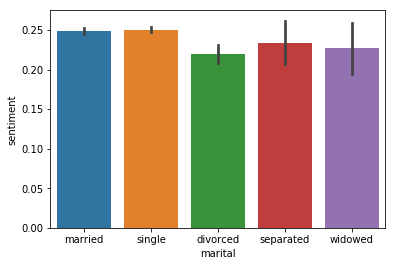

In [291]:
import matplotlib.pyplot as plt
import numpy as np

sns.barplot(x="marital", y="sentiment", data=overall)

/Users/mengranxia/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


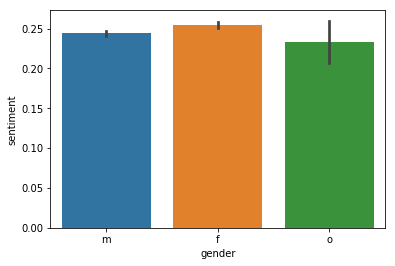

In [28]:
sns.barplot(x="gender", y="sentiment", data=overall)

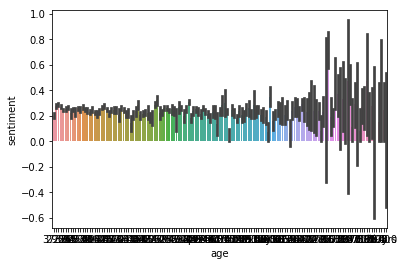

In [42]:
sns.barplot(x=overall['age'], y="sentiment", data=overall)

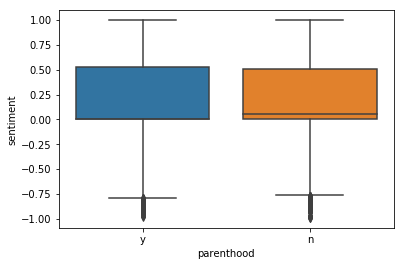

In [33]:
sns.boxplot(x="parenthood", y="sentiment", data=overall)

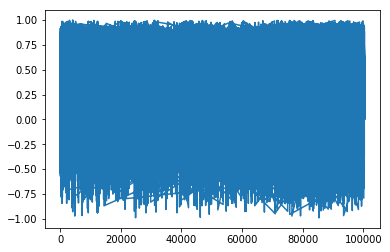

In [37]:
overall["sentiment"].plot()